In [1]:
import numpy as np
import tensorflow as tf
from random import randint
import scipy as scipy
import scipy.interpolate as interpolate
import math
from random import *
from sklearn.decomposition import PCA
from sklearn.datasets import load_diabetes
from scipy.stats import logistic
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from keras_radam.training import RAdamOptimizer

import tflib as lib
import tflib.save_images
import tflib.plot

#converters = {i:lambda s: float(s or -1000) for i in range(105)}

nasdaq = np.genfromtxt("./full/full_non_padding.csv", dtype='f', delimiter=',', skip_header=1, filling_values=0.0)

indices = []
i=0
for h in nasdaq.tolist():
    if all(h):
        indices.append(i)
    i=i+1

images = nasdaq[indices,0:104]
index = np.reshape(nasdaq[:,104], (-1,1))/2
nasdaq = nasdaq[:,0:104]
print(images.shape)
np.random.shuffle(images)
#images = images[0:74501:15,:]
#print(images.shape)

(9895, 104)


In [2]:
# main parameters
Num_iter = 2000
N = 30000
max_grad_norm = 1000

BATCH_SIZE = 1000
BATCH_SIZE_2 = 1000
Lambda = 10.0
k=3

# additional parameters
gamma = 1.0
lr_decay = 0.3

dimensionality = images.shape[1]
number_of_points = images.shape[0]
number_of_neurons = number_of_points

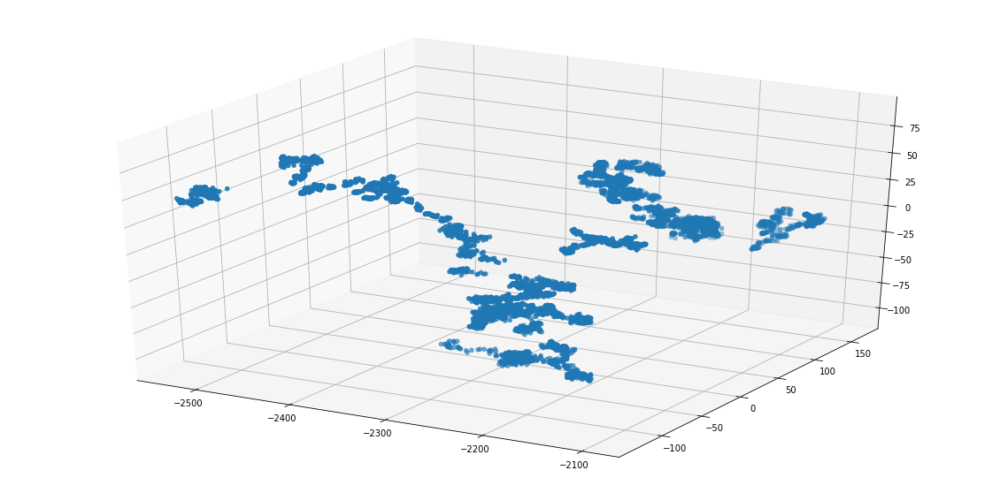

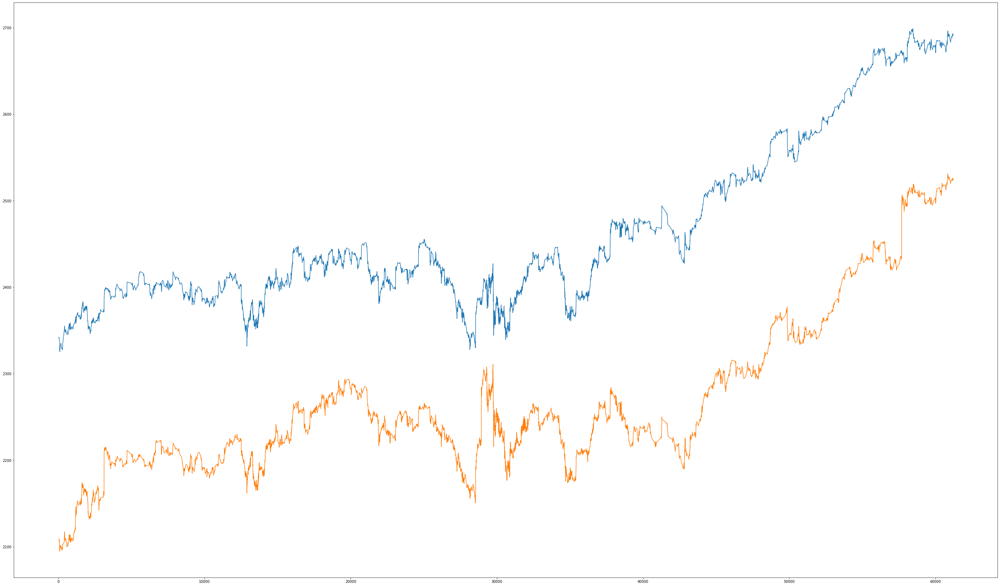

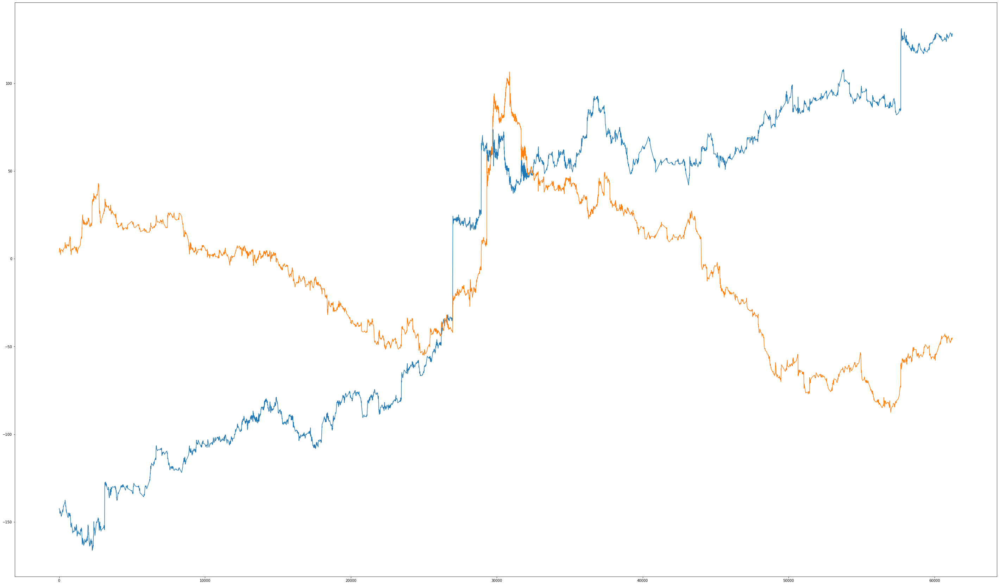

In [3]:
from mpl_toolkits.mplot3d import Axes3D

u, s, vh = np.linalg.svd(images, full_matrices=True)
D = vh[0:k]
P_svd = np.matmul(np.transpose(D), D)

fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
Data = np.matmul(images, np.transpose(D))
ax.scatter(Data[:,0], Data[:,1], Data[:,2])
plt.show()

plt.figure(figsize=(50,30))
plt.plot(indices, index[indices], label = "NASDAQ")

first = np.matmul(nasdaq, np.reshape(vh[0], (-1,1)))
plt.plot(indices, -first[indices],  label = "First Component")
#plt.title('NASDAQ & First Component') 
plt.show()


plt.figure(figsize=(50,30))
second = np.matmul(nasdaq, np.reshape(vh[1], (-1,1)))
Covariance = np.cov(index[indices], second[indices], bias=True)[0][1]
bit = -1
if Covariance>0:
    bit = 1
plt.plot(indices, bit*second[indices], label = "Second Component")


third = np.matmul(nasdaq, np.reshape(vh[2], (-1,1)))
Covariance = np.cov(index[indices], third[indices], bias=True)[0][1]
bit = -1
if Covariance>0:
    bit = 1
plt.plot(indices, bit*third[indices], label = "Third Component")
#plt.title('Second & Third Component') 
plt.show()

Data = np.float32(np.transpose(images))

In [4]:
new_lr = tf.placeholder(tf.float32, shape=[], name="new_learning_rate")
Dataplace = tf.placeholder(tf.float32, shape=(dimensionality, None))

tf_data_x = gamma*tf.random_normal([BATCH_SIZE, dimensionality]) # аргументы функции
tf_data_y = tf.reduce_mean(tf.math.cos(tf.matmul(tf_data_x, Dataplace)), axis=1) # значения функции

tf_data_w = tf.placeholder(tf.float32, shape=(number_of_neurons,1))
tf_data_B = tf.placeholder(tf.float32, shape=(dimensionality,number_of_neurons))
tf_data_P = tf.placeholder(tf.float32, shape=(dimensionality, dimensionality))

tf_data_second = gamma*tf.random_normal([BATCH_SIZE_2, dimensionality])
Lbd = tf.placeholder(tf.float32, shape=[], name="lambda")

w = tf.Variable(tf.random_normal([number_of_neurons,1], stddev=0.0), name="neuron_weights")
B = tf.Variable(initial_value=Data, name="weights")

prediction = (2/number_of_neurons)*tf.matmul(tf.math.cos(tf.matmul(tf_data_x, B)), tf.nn.sigmoid(w))
#penalty = tf.square(tf.reduce_sum(tf.nn.sigmoid(w))-1.0)

out_loss = tf.reduce_mean(tf.square(prediction - tf_data_y))# + C*penalty

prediction2 = (2/number_of_neurons)*tf.matmul(tf.math.cos(tf.matmul(tf_data_second, B)), tf.nn.sigmoid(w))

grad_psi = tf.reshape(tf.gradients(prediction2, [tf_data_second])[0], [BATCH_SIZE_2, dimensionality])

new_part = grad_psi

tf_prediction2 = (2/number_of_neurons)*tf.matmul(tf.math.cos(tf.matmul(tf_data_second, tf_data_B)), tf.nn.sigmoid(tf_data_w))

tf_data_grad_psi = tf.reshape(tf.gradients(tf_prediction2, [tf_data_second])[0], [BATCH_SIZE_2, dimensionality])

old_part = tf.matmul(tf_data_grad_psi, tf_data_P)

loss = out_loss + Lbd*tf.reduce_mean(tf.reduce_sum(tf.square(tf.subtract(new_part, old_part)), axis=1))

In [5]:
tvars = tf.trainable_variables()
grads, _ = tf.clip_by_global_norm(tf.gradients(loss, tvars), max_grad_norm)
optimizer = RAdamOptimizer(learning_rate=new_lr, beta1=0.5, beta2=0.9) #tf.train.GradientDescentOptimizer(new_lr) tf.train.AdamOptimizer(learning_rate=new_lr, beta1=0.5, beta2=0.9) RMSPropOptimizer(new_lr) 
target = optimizer.apply_gradients(zip(grads, tvars), global_step=tf.contrib.framework.get_or_create_global_step())

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Please switch to tf.train.get_or_create_global_step


epoch = 1, train error = 7843.54072266
epoch = 1001, train error = 2820.90570557
epoch = 2001, train error = 1438.07540649
epoch = 3001, train error = 831.52589417
epoch = 4001, train error = 489.01262878
epoch = 5001, train error = 291.04622009
epoch = 6001, train error = 168.59320526
epoch = 7001, train error = 97.72684250
epoch = 8001, train error = 55.96883251
epoch = 9001, train error = 31.85515522
epoch = 10001, train error = 18.27410873
epoch = 11001, train error = 10.14385207
epoch = 12001, train error = 5.77691252
epoch = 13001, train error = 3.22379292
epoch = 14001, train error = 1.80595213
epoch = 15001, train error = 1.01087160
epoch = 16001, train error = 0.57226849
epoch = 17001, train error = 0.31764836
epoch = 18001, train error = 0.17777983
epoch = 19001, train error = 0.09947515
epoch = 20001, train error = 0.05592695
epoch = 21001, train error = 0.03126738
epoch = 22001, train error = 0.01757157
epoch = 23001, train error = 0.00992411
epoch = 24001, train error = 0.

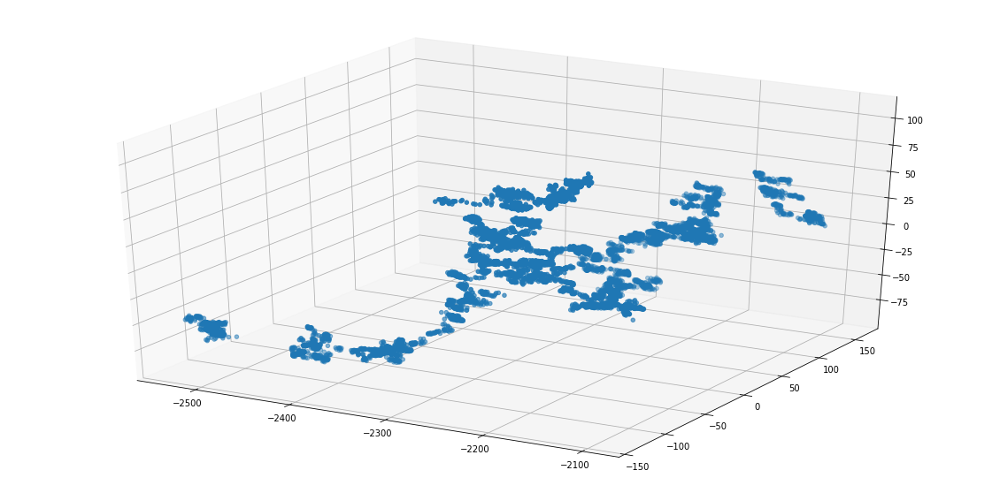

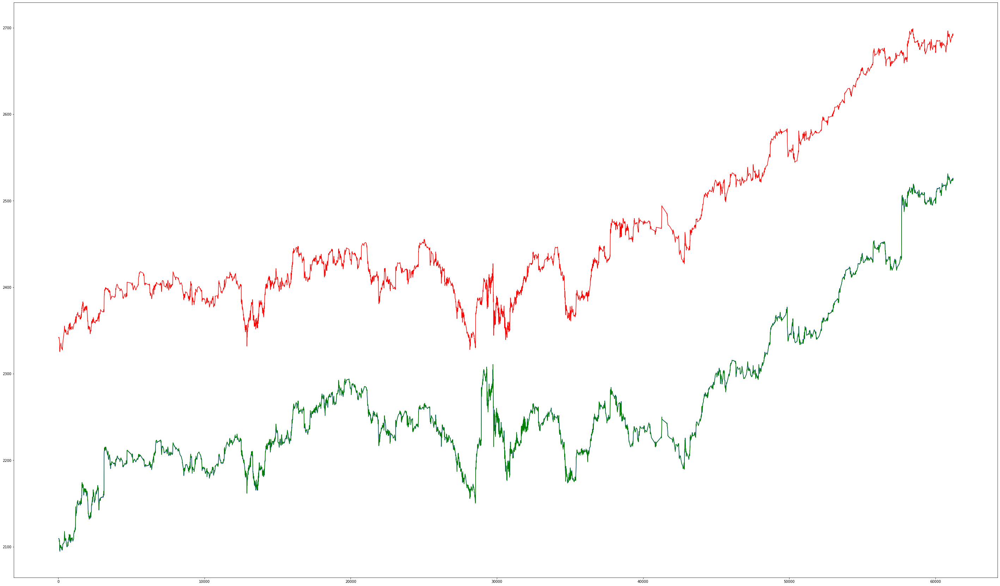

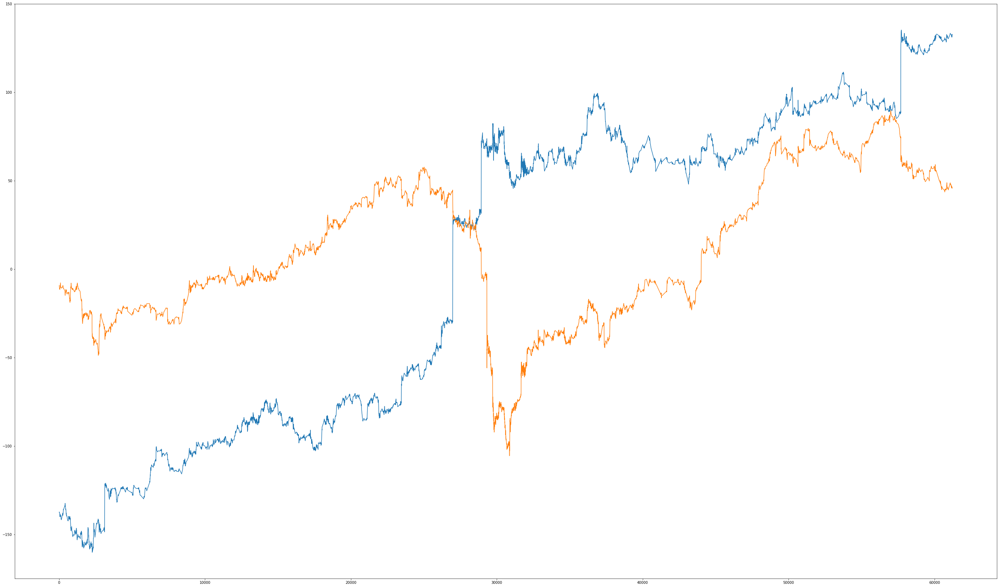

0.0014014642
7.284454e-07
0.119753025
iter 0	Distance-till-svd	0.11975302547216415	Total-variance-to-retain %	0.0005197745049372315	Total-variance-to-retain	7.284454000000551e-07
epoch = 1, train error = 0.00015290
epoch = 1001, train error = 0.00015237
epoch = 2001, train error = 0.00015253
epoch = 3001, train error = 0.00015262
epoch = 4001, train error = 0.00015304
epoch = 5001, train error = 0.00015265
epoch = 6001, train error = 0.00015275
epoch = 7001, train error = 0.00015371
epoch = 8001, train error = 0.00015282
epoch = 9001, train error = 0.00015343
epoch = 10001, train error = 0.00015367
epoch = 11001, train error = 0.00015303
epoch = 12001, train error = 0.00015330
[1.41130912e-03 1.83925852e-06 4.81371274e-07 2.63404701e-07
 1.56746012e-07 6.89030770e-08 5.65195712e-08 4.14580654e-08
 2.91777305e-08 2.05373407e-08 1.48213051e-08 9.87767912e-09
 8.83153728e-09 7.06770908e-09 6.25703445e-09 5.38338307e-09
 5.23413357e-09 4.43029347e-09 3.54982532e-09 2.98324809e-09
 2.430084

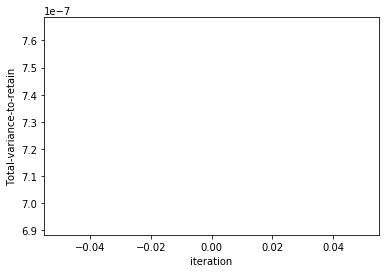

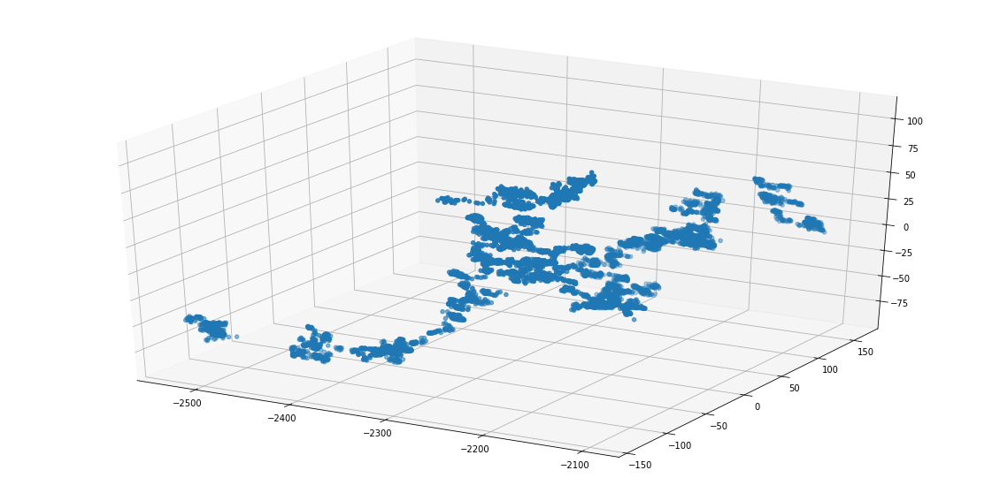

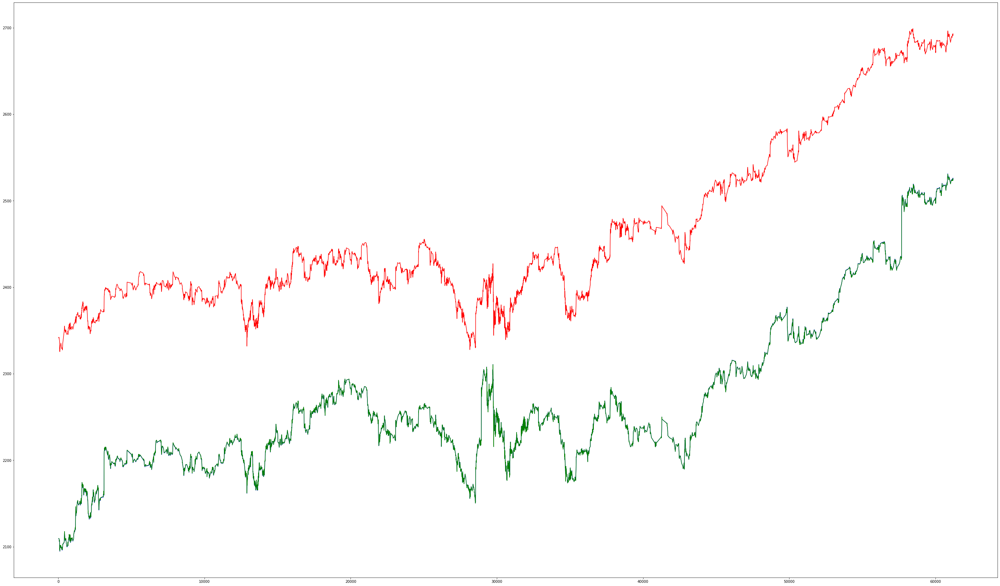

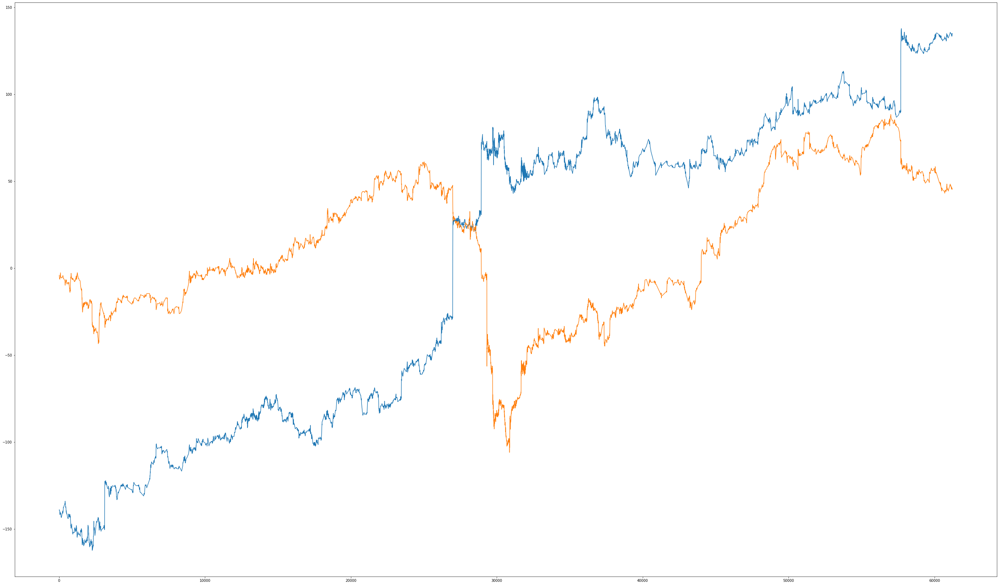

0.0014143579
7.2822525e-07
0.1073438
iter 1	Distance-till-svd	0.10734380036592484	Total-variance-to-retain %	0.0005148804630152881	Total-variance-to-retain	7.282252454388072e-07
epoch = 1, train error = 0.00015290
epoch = 1001, train error = 0.00015316
epoch = 2001, train error = 0.00015286
epoch = 3001, train error = 0.00015483
epoch = 4001, train error = 0.00015292
epoch = 5001, train error = 0.00015224
epoch = 6001, train error = 0.00015191
epoch = 7001, train error = 0.00015438
epoch = 8001, train error = 0.00015240
epoch = 9001, train error = 0.00015327
epoch = 10001, train error = 0.00015207
epoch = 11001, train error = 0.00015279
epoch = 12001, train error = 0.00015224
epoch = 13001, train error = 0.00015260
epoch = 14001, train error = 0.00015303
epoch = 15001, train error = 0.00015422
[1.31599267e-03 1.73252408e-06 5.15808154e-07 2.28571878e-07
 1.56715998e-07 7.15106125e-08 5.15412601e-08 3.87448402e-08
 3.11942223e-08 2.05626289e-08 1.41120609e-08 9.91710181e-09
 8.79131434e

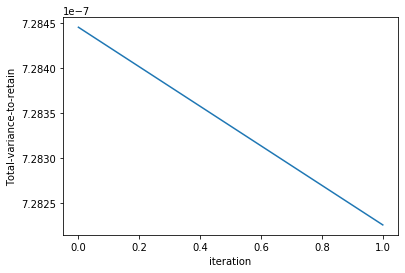

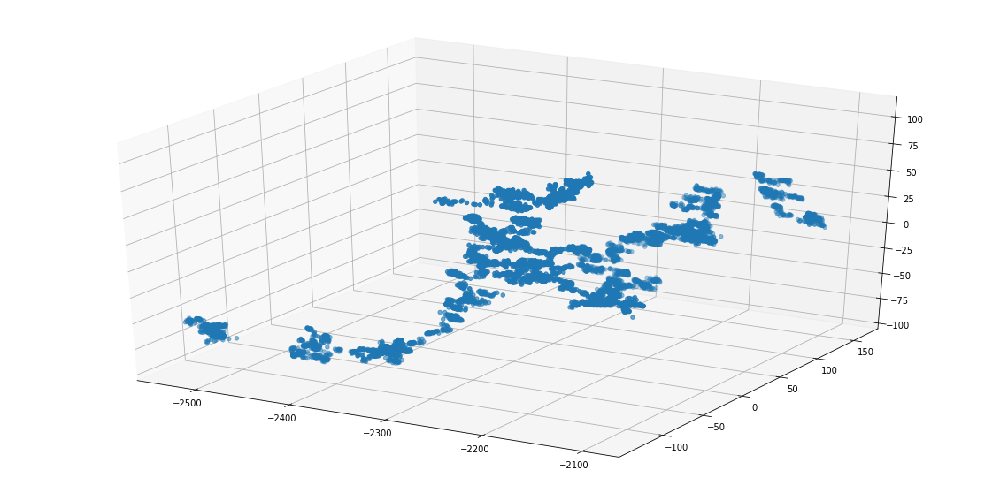

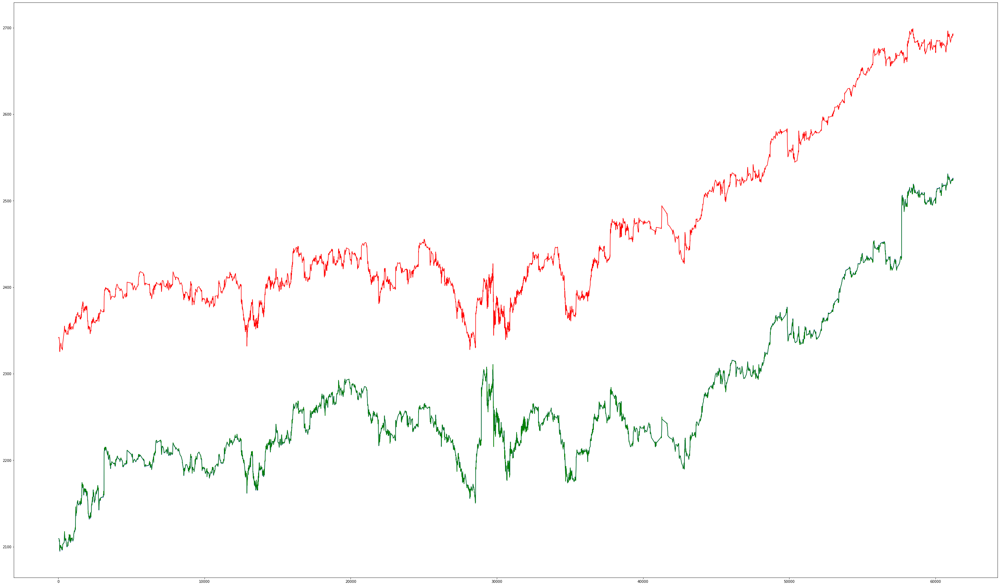

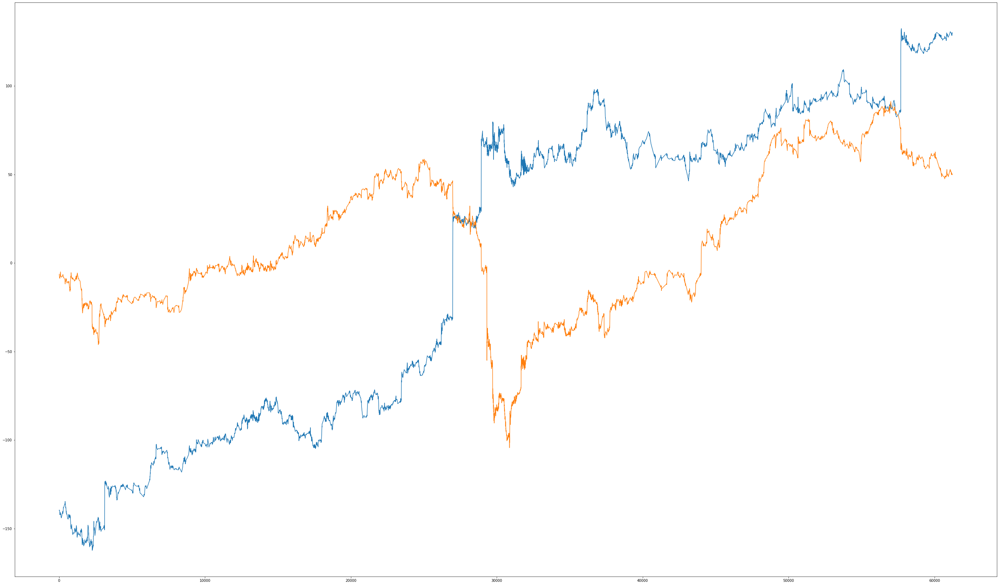

0.0013189324
6.914099e-07
0.083511814
iter 2	Distance-till-svd	0.08351181447505951	Total-variance-to-retain %	0.0005242193583399057	Total-variance-to-retain	6.914099230925785e-07
epoch = 1, train error = 0.00015326
epoch = 1001, train error = 0.00015337
epoch = 2001, train error = 0.00015235
epoch = 3001, train error = 0.00015314
epoch = 4001, train error = 0.00015322
epoch = 5001, train error = 0.00015392
epoch = 6001, train error = 0.00015255
epoch = 7001, train error = 0.00015375
epoch = 8001, train error = 0.00015275
epoch = 9001, train error = 0.00015389
epoch = 10001, train error = 0.00015195
epoch = 11001, train error = 0.00015388
epoch = 12001, train error = 0.00015427
[1.28425669e-03 1.94886093e-06 5.08998994e-07 2.40469490e-07
 1.57380825e-07 6.75990179e-08 5.70861083e-08 3.80171308e-08
 3.16428839e-08 2.09999289e-08 1.37317100e-08 1.00533475e-08
 9.21916765e-09 6.71146561e-09 6.13589002e-09 5.68200287e-09
 5.29754507e-09 4.22079793e-09 3.68804520e-09 3.17485416e-09
 2.399475

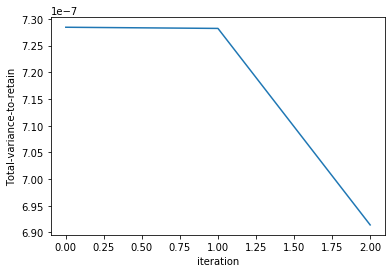

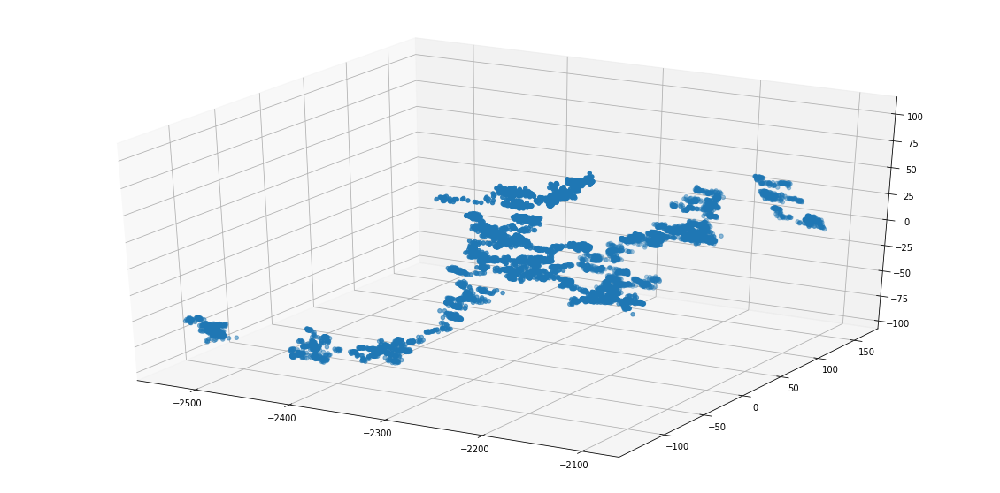

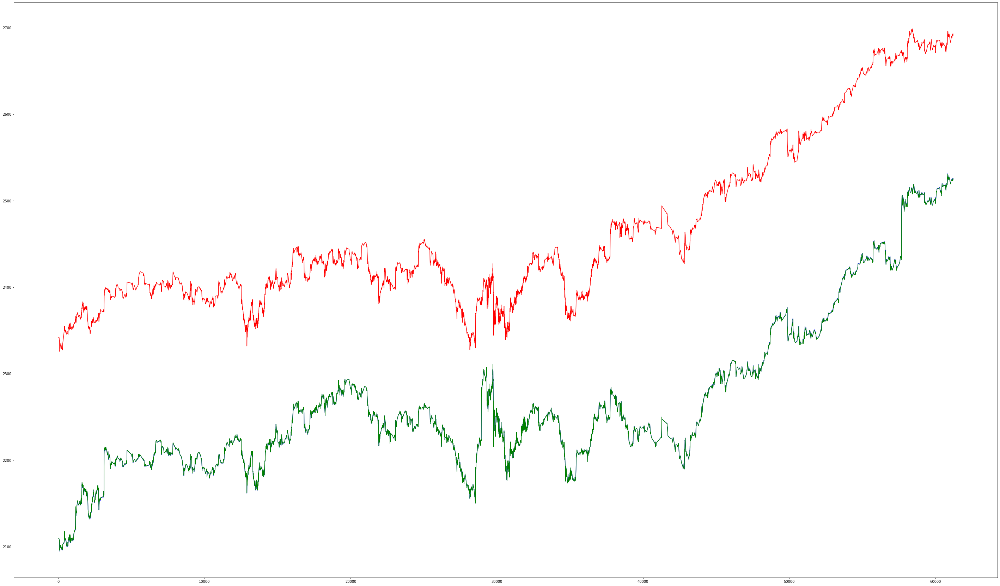

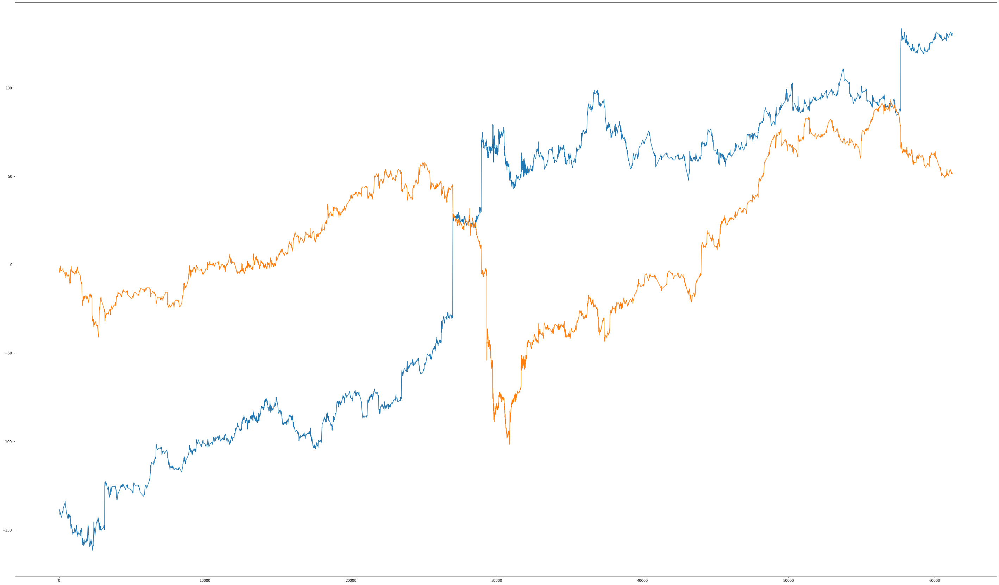

0.0012874189
7.0432594e-07
0.056950845
iter 3	Distance-till-svd	0.05695084482431412	Total-variance-to-retain %	0.0005470837350003421	Total-variance-to-retain	7.043259415695502e-07
epoch = 1, train error = 0.00015358
epoch = 1001, train error = 0.00015306
epoch = 2001, train error = 0.00015348
epoch = 3001, train error = 0.00015341
epoch = 4001, train error = 0.00015464
epoch = 5001, train error = 0.00015386
epoch = 6001, train error = 0.00015281
epoch = 7001, train error = 0.00015340
epoch = 8001, train error = 0.00015309
epoch = 9001, train error = 0.00015387
epoch = 10001, train error = 0.00015278
epoch = 11001, train error = 0.00015317
epoch = 12001, train error = 0.00015286
epoch = 13001, train error = 0.00015310
epoch = 14001, train error = 0.00015256
epoch = 15001, train error = 0.00015353
epoch = 16001, train error = 0.00015332
epoch = 17001, train error = 0.00015279
epoch = 18001, train error = 0.00015336
[1.34760921e-03 1.99102465e-06 4.96156872e-07 2.49813041e-07
 1.75741150e

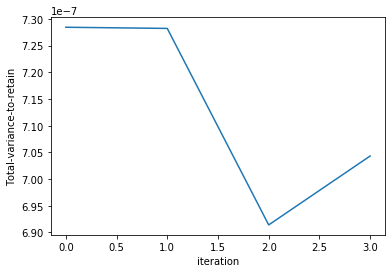

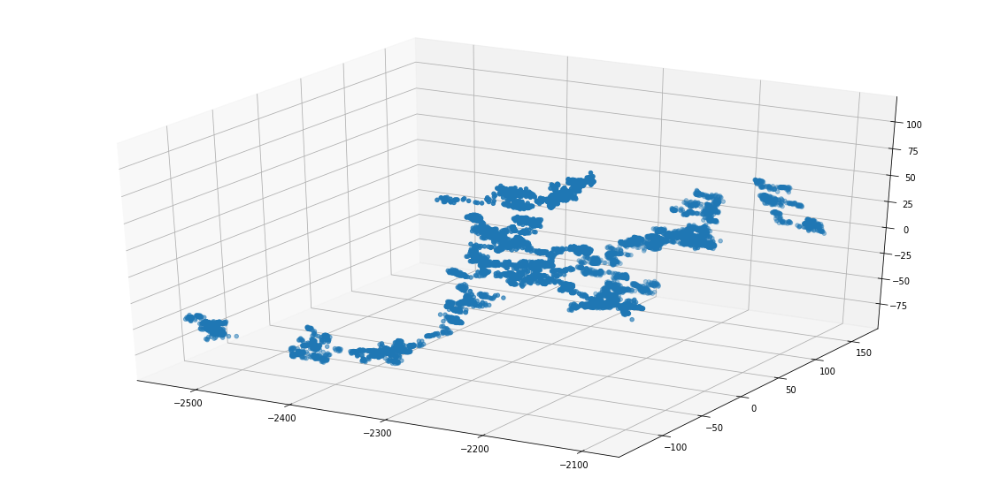

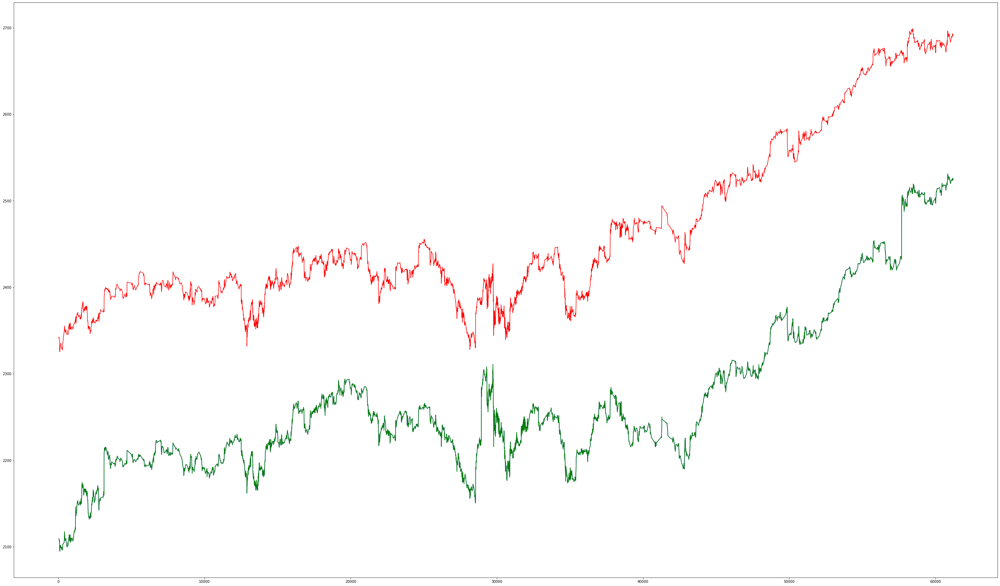

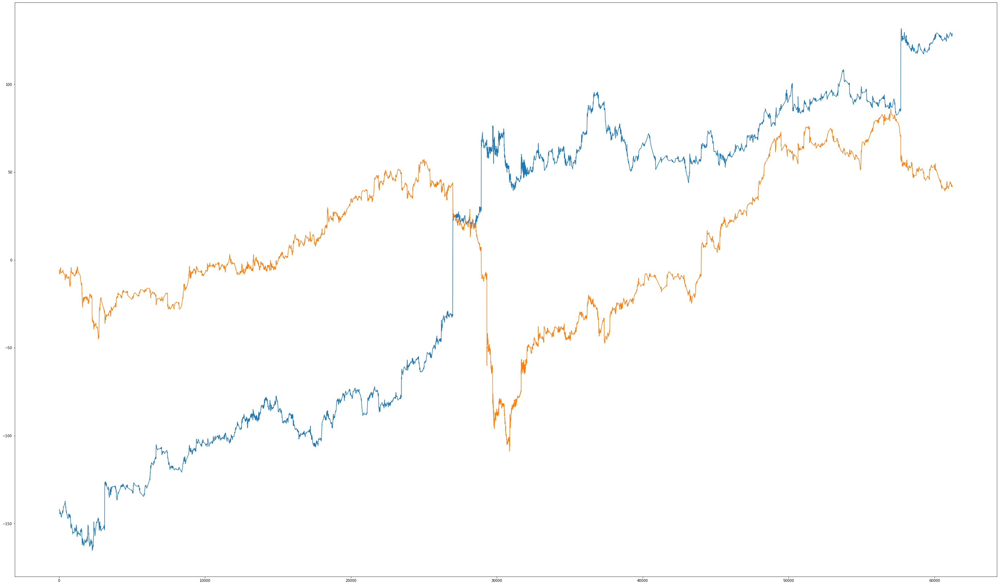

0.0013508222
7.2577217e-07
0.11817657
iter 4	Distance-till-svd	0.11817657202482224	Total-variance-to-retain %	0.0005372817977331579	Total-variance-to-retain	7.25772167697869e-07
epoch = 1, train error = 0.00015371
epoch = 1001, train error = 0.00015408
epoch = 2001, train error = 0.00015430
epoch = 3001, train error = 0.00015370
epoch = 4001, train error = 0.00015217
epoch = 5001, train error = 0.00015188
epoch = 6001, train error = 0.00015187
epoch = 7001, train error = 0.00015235
epoch = 8001, train error = 0.00015367
epoch = 9001, train error = 0.00015247
epoch = 10001, train error = 0.00015304
epoch = 11001, train error = 0.00015400
epoch = 12001, train error = 0.00015246
epoch = 13001, train error = 0.00015290
[1.25467265e-03 1.96798464e-06 5.12855252e-07 2.53417255e-07
 1.66078991e-07 7.07530816e-08 4.99495343e-08 3.87464034e-08
 3.13176258e-08 1.98050589e-08 1.21474297e-08 1.01217417e-08
 8.82480311e-09 7.19462223e-09 5.89903237e-09 5.68413094e-09
 5.45800072e-09 4.68243577e-09 

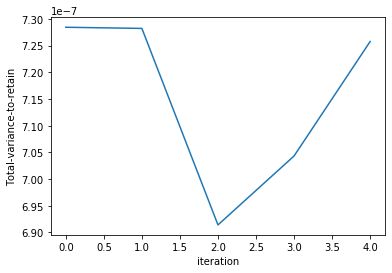

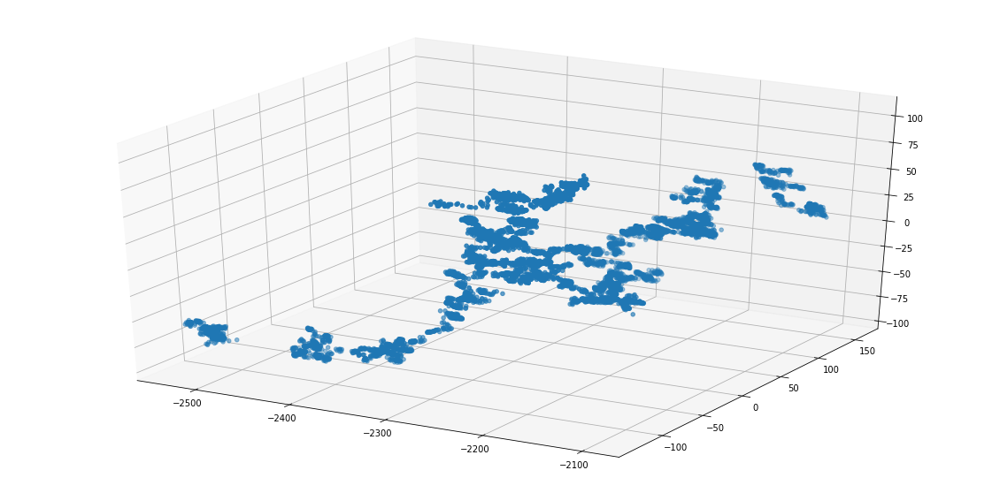

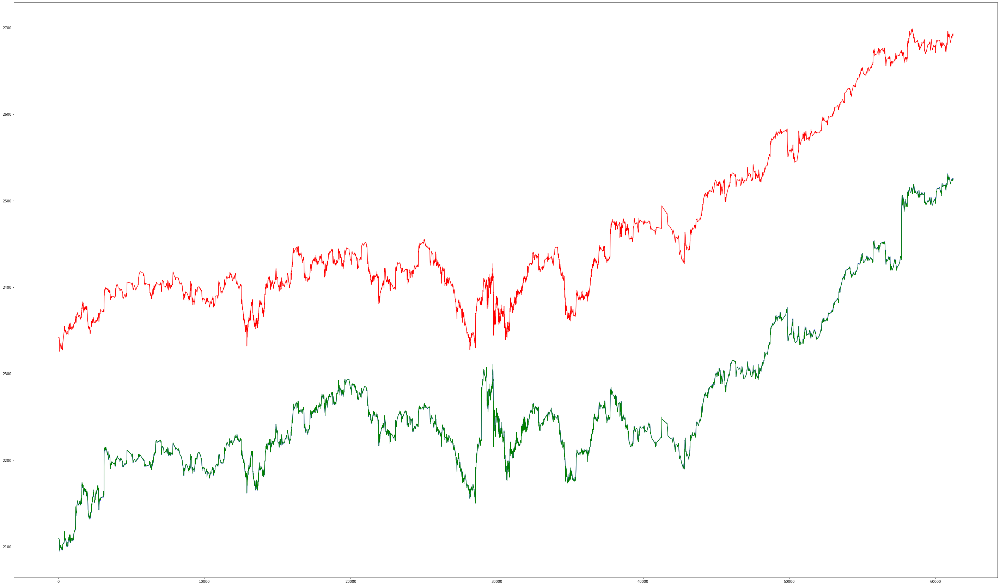

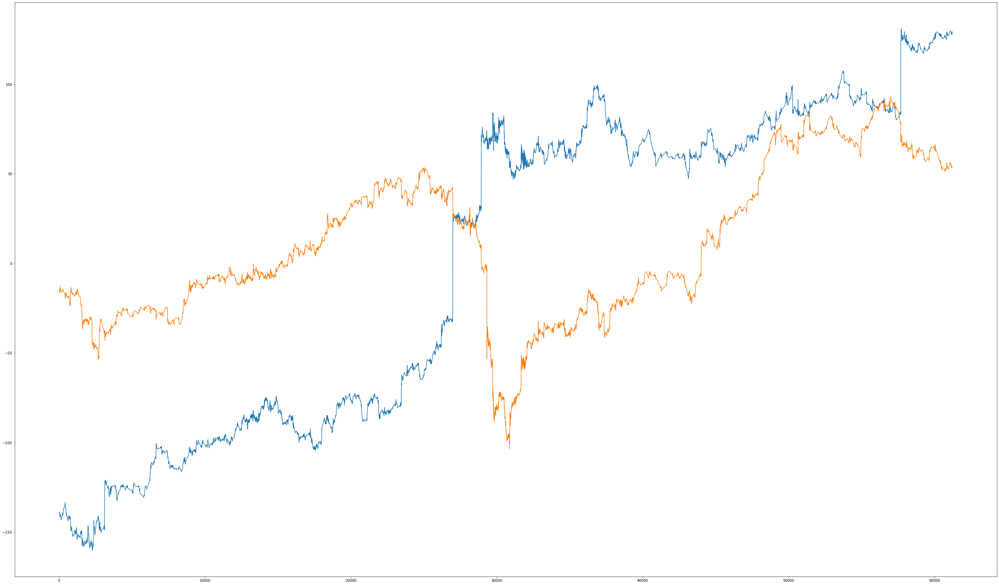

0.0012578737
7.201352e-07
0.06668625
iter 5	Distance-till-svd	0.066686250269413	Total-variance-to-retain %	0.0005725019727833569	Total-variance-to-retain	7.201351763796993e-07
epoch = 1, train error = 0.00015340
epoch = 1001, train error = 0.00015240
epoch = 2001, train error = 0.00015323
epoch = 3001, train error = 0.00015344
epoch = 4001, train error = 0.00015355
epoch = 5001, train error = 0.00015233
epoch = 6001, train error = 0.00015319
epoch = 7001, train error = 0.00015344
epoch = 8001, train error = 0.00015291
epoch = 9001, train error = 0.00015317
epoch = 10001, train error = 0.00015308
epoch = 11001, train error = 0.00015355
[1.23614783e-03 1.90698154e-06 5.07220761e-07 2.58170189e-07
 1.65979486e-07 6.13266167e-08 5.54239428e-08 3.85832912e-08
 2.99841822e-08 2.02746673e-08 1.35146543e-08 1.02325250e-08
 8.63991012e-09 6.88239732e-09 6.39967634e-09 5.83768456e-09
 5.67305447e-09 4.46196724e-09 3.60291574e-09 2.90169089e-09
 2.52191512e-09 2.18835572e-09 1.82912407e-09 1.4358

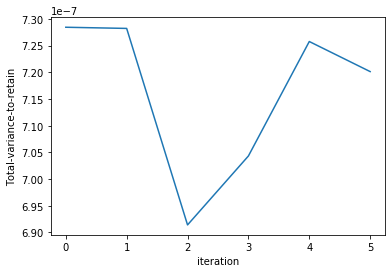

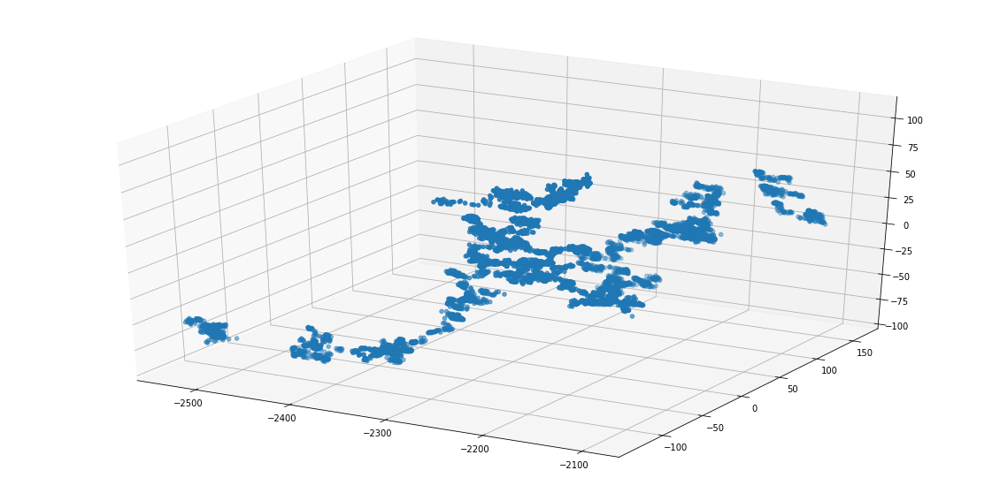

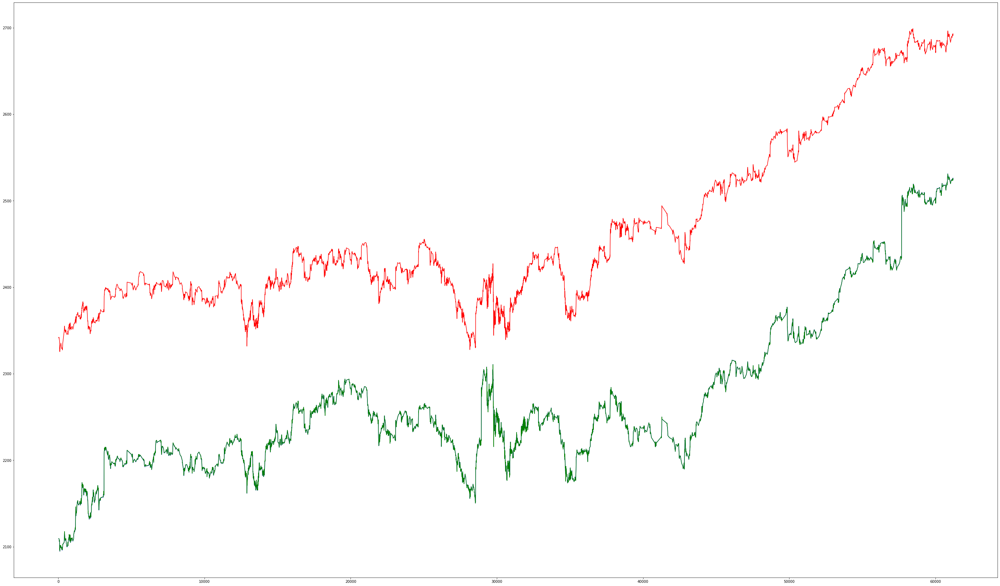

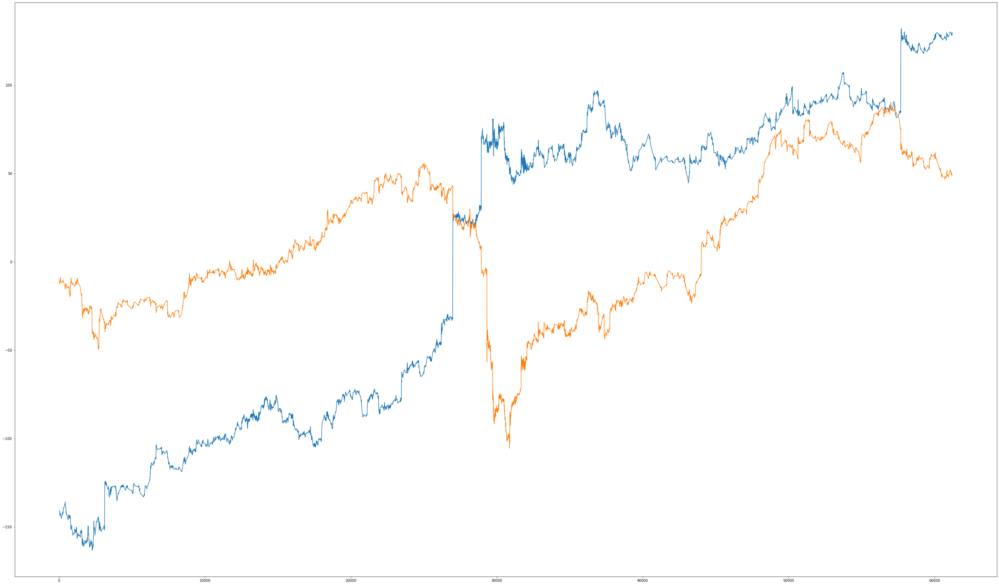

0.0012392829
7.2079087e-07
0.083680704
iter 6	Distance-till-svd	0.08368070423603058	Total-variance-to-retain %	0.0005816193297505379	Total-variance-to-retain	7.207908652162587e-07
epoch = 1, train error = 0.00015281
epoch = 1001, train error = 0.00015264
epoch = 2001, train error = 0.00015222
epoch = 3001, train error = 0.00015294
epoch = 4001, train error = 0.00015212
epoch = 5001, train error = 0.00015511
epoch = 6001, train error = 0.00015469
epoch = 7001, train error = 0.00015236
epoch = 8001, train error = 0.00015297
epoch = 9001, train error = 0.00015301
epoch = 10001, train error = 0.00015377
epoch = 11001, train error = 0.00015350
epoch = 12001, train error = 0.00015272
epoch = 13001, train error = 0.00015247
epoch = 14001, train error = 0.00015349
epoch = 15001, train error = 0.00015206
epoch = 16001, train error = 0.00015360
epoch = 17001, train error = 0.00015293
epoch = 18001, train error = 0.00015203
epoch = 19001, train error = 0.00015228
[1.3973899e-03 1.8820299e-06 4.75

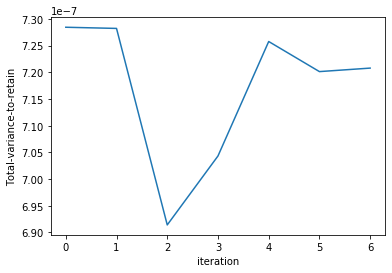

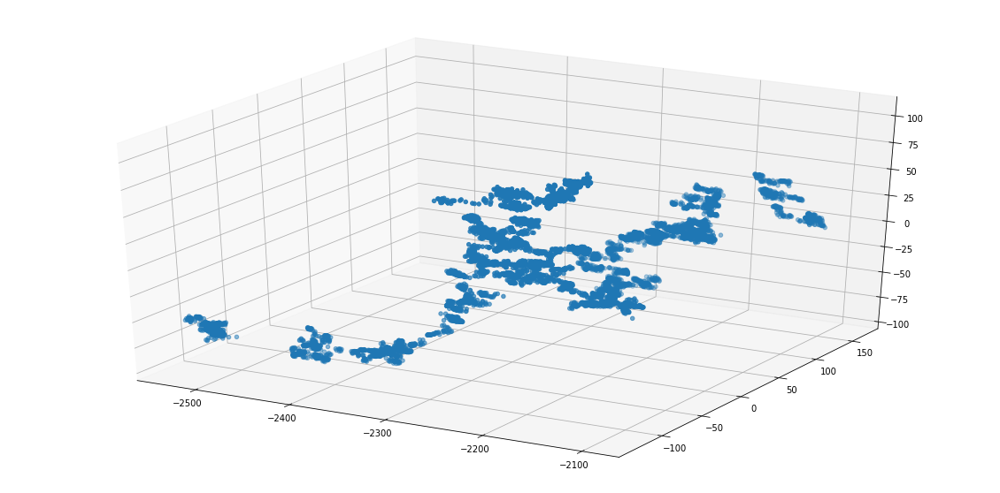

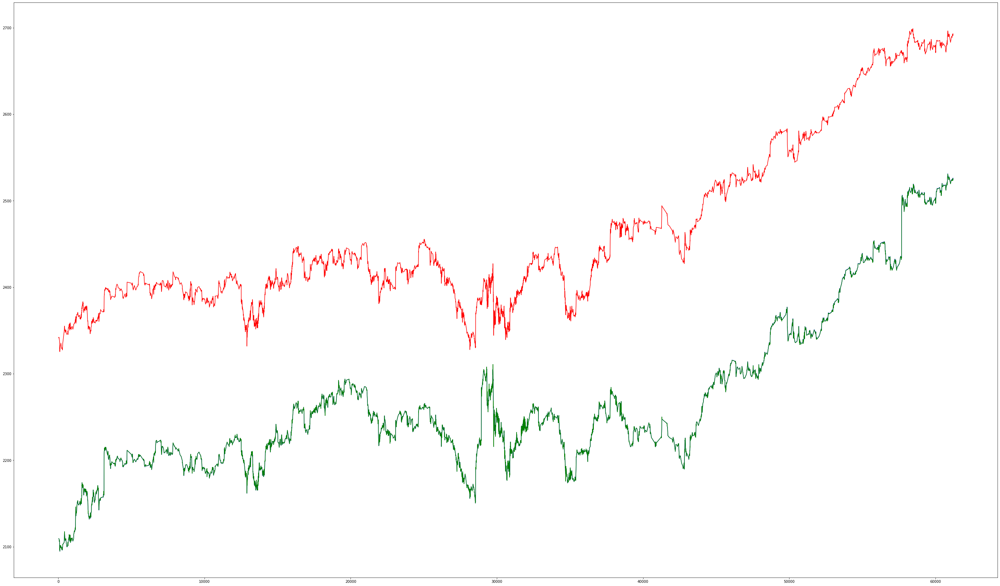

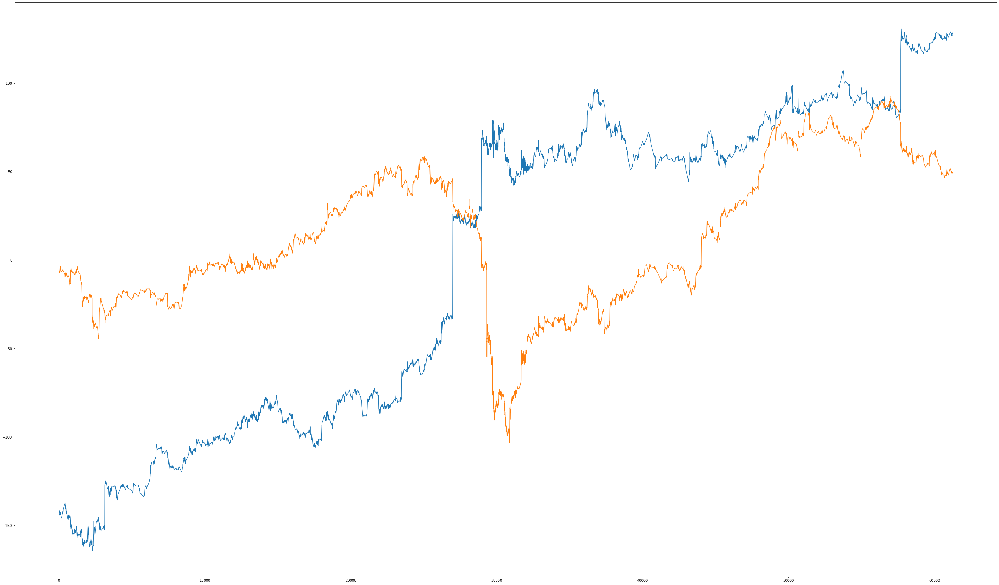

0.0014004308
6.837451e-07
0.11021718
iter 7	Distance-till-svd	0.11021717637777328	Total-variance-to-retain %	0.00048823910765349865	Total-variance-to-retain	6.837450996499683e-07
epoch = 1, train error = 0.00015441
epoch = 1001, train error = 0.00015347
epoch = 2001, train error = 0.00015402
epoch = 3001, train error = 0.00015297
epoch = 4001, train error = 0.00015220
epoch = 5001, train error = 0.00015394
epoch = 6001, train error = 0.00015274
epoch = 7001, train error = 0.00015153
epoch = 8001, train error = 0.00015356
epoch = 9001, train error = 0.00015254
epoch = 10001, train error = 0.00015538
epoch = 11001, train error = 0.00015276
epoch = 12001, train error = 0.00015327
epoch = 13001, train error = 0.00015256
epoch = 14001, train error = 0.00015393
epoch = 15001, train error = 0.00015268
epoch = 16001, train error = 0.00015503
[1.3325152e-03 1.7856471e-06 4.7718214e-07 2.3386207e-07 1.6300825e-07
 6.8364407e-08 5.3778848e-08 3.7457205e-08 3.1114705e-08 2.1125652e-08
 1.3870576e-

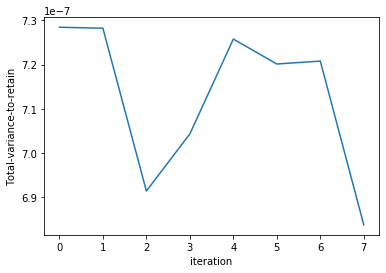

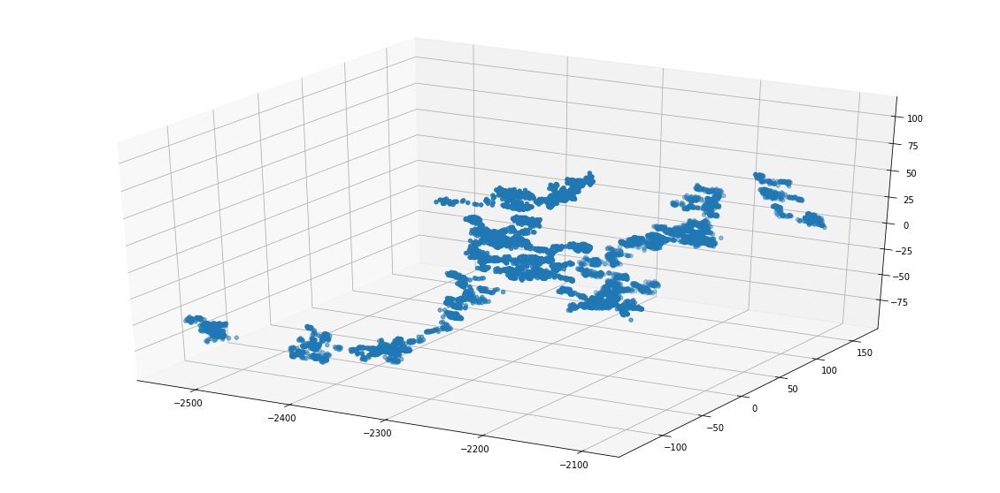

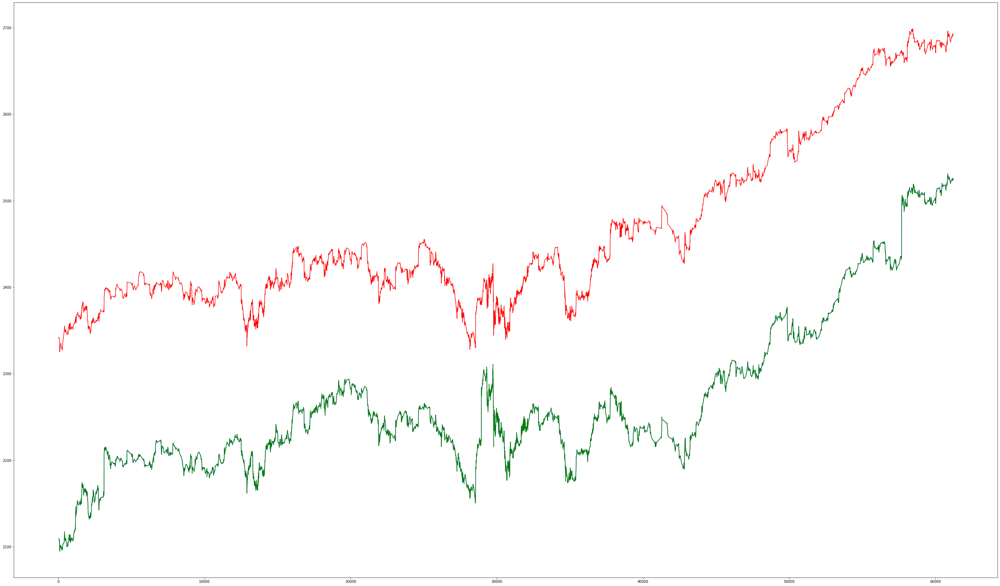

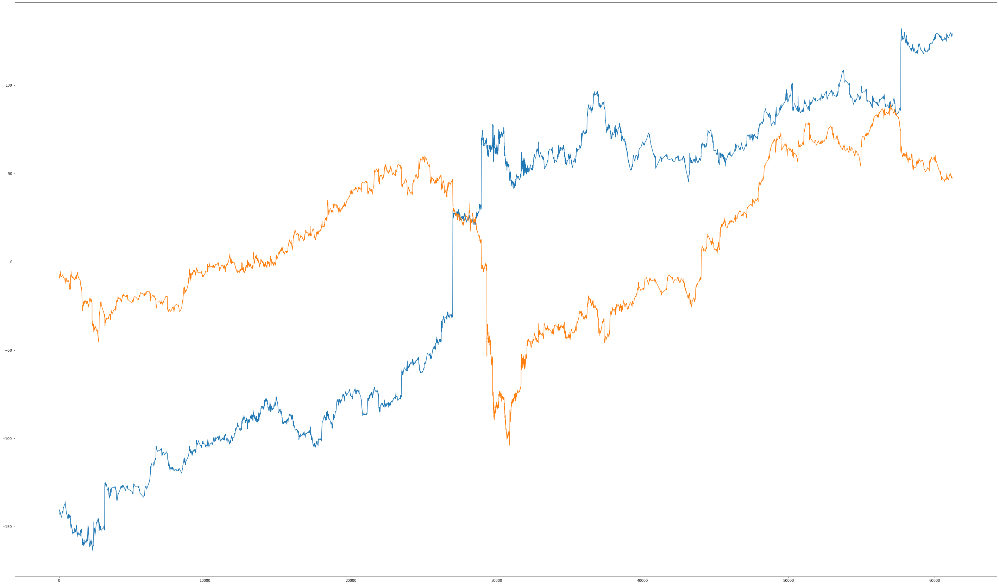

0.0013354783
7.004153e-07
0.11345717
iter 8	Distance-till-svd	0.11345717310905457	Total-variance-to-retain %	0.0005244677304290235	Total-variance-to-retain	7.004152848821832e-07
epoch = 1, train error = 0.00015204
epoch = 1001, train error = 0.00015291
epoch = 2001, train error = 0.00015383
epoch = 3001, train error = 0.00015274
epoch = 4001, train error = 0.00015158
epoch = 5001, train error = 0.00015323
epoch = 6001, train error = 0.00015294
epoch = 7001, train error = 0.00015289
epoch = 8001, train error = 0.00015431
epoch = 9001, train error = 0.00015364
epoch = 10001, train error = 0.00015475
epoch = 11001, train error = 0.00015141
epoch = 12001, train error = 0.00015286
epoch = 13001, train error = 0.00015394
epoch = 14001, train error = 0.00015324
epoch = 15001, train error = 0.00015315
epoch = 16001, train error = 0.00015322
[1.32934516e-03 1.72318914e-06 5.14390649e-07 2.27660877e-07
 1.73930090e-07 6.46325873e-08 5.00049637e-08 4.17253929e-08
 3.14958442e-08 2.10080842e-08 1.

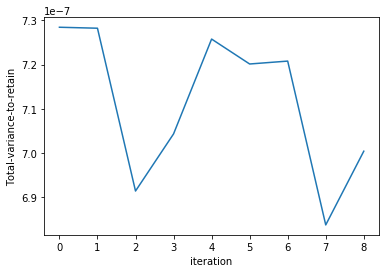

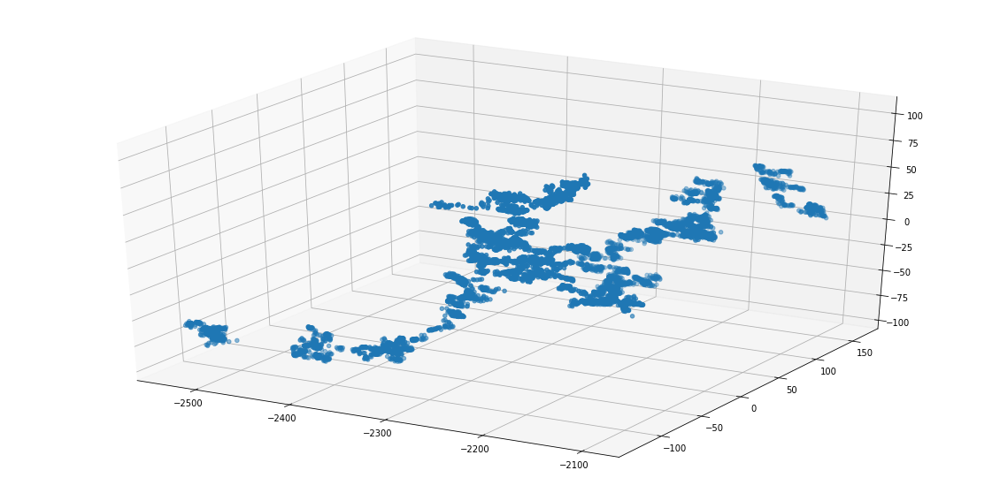

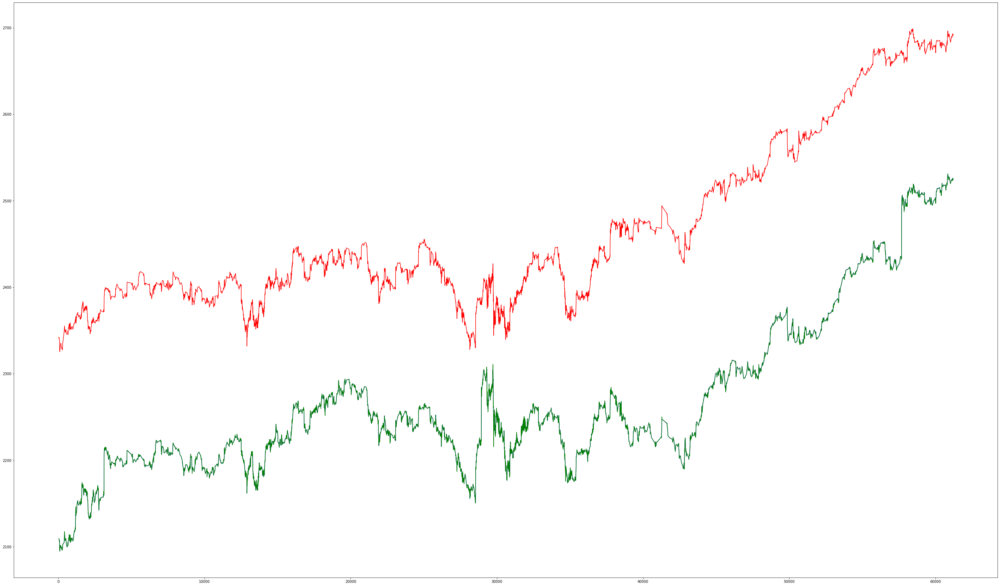

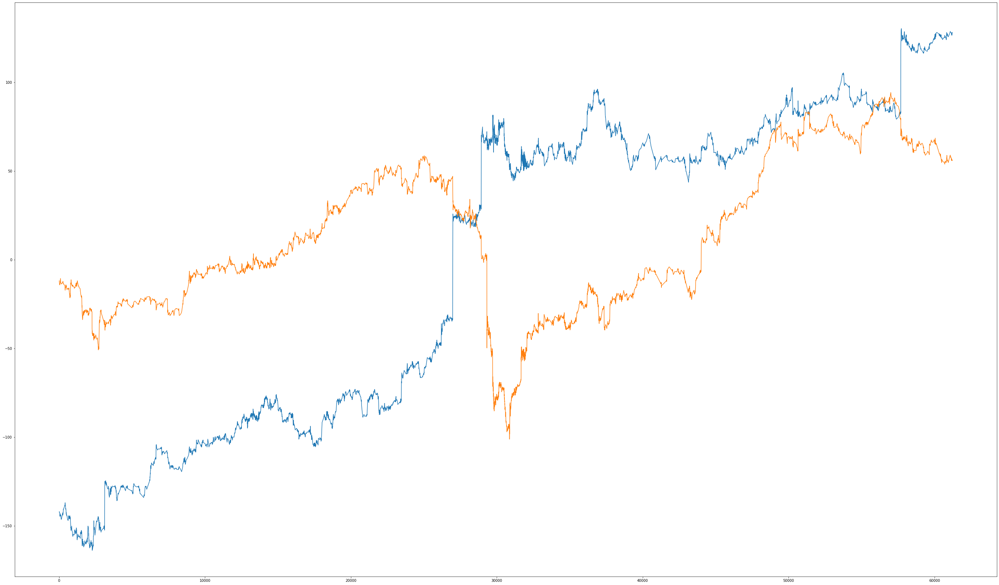

0.0013322853
7.0279884e-07
0.110669844
iter 9	Distance-till-svd	0.11066984385251999	Total-variance-to-retain %	0.0005275137373246253	Total-variance-to-retain	7.027988431218546e-07
epoch = 1, train error = 0.00015277
epoch = 1001, train error = 0.00015254
epoch = 2001, train error = 0.00015232
epoch = 3001, train error = 0.00015207
epoch = 4001, train error = 0.00015259
epoch = 5001, train error = 0.00015333
epoch = 6001, train error = 0.00015487
epoch = 7001, train error = 0.00015426
epoch = 8001, train error = 0.00015259
epoch = 9001, train error = 0.00015375
epoch = 10001, train error = 0.00015342
epoch = 11001, train error = 0.00015391
epoch = 12001, train error = 0.00015292
epoch = 13001, train error = 0.00015462
epoch = 14001, train error = 0.00015384
epoch = 15001, train error = 0.00015304
epoch = 16001, train error = 0.00015306
epoch = 17001, train error = 0.00015383
[1.31819083e-03 1.87017179e-06 5.33917557e-07 2.50766078e-07
 1.67221458e-07 6.69406717e-08 5.25675077e-08 4.1923

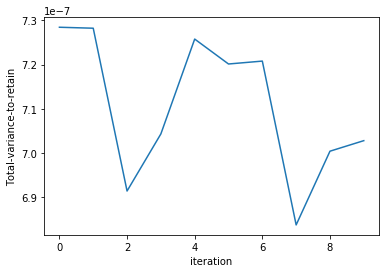

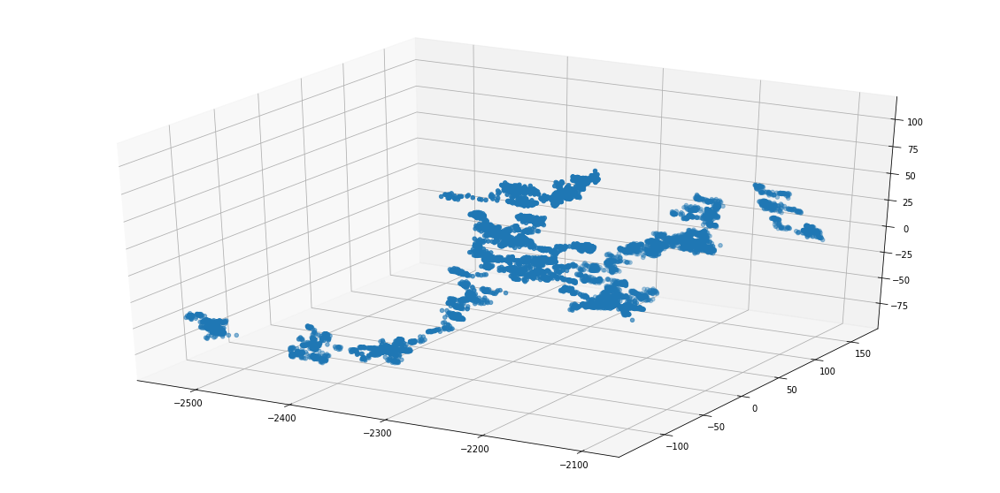

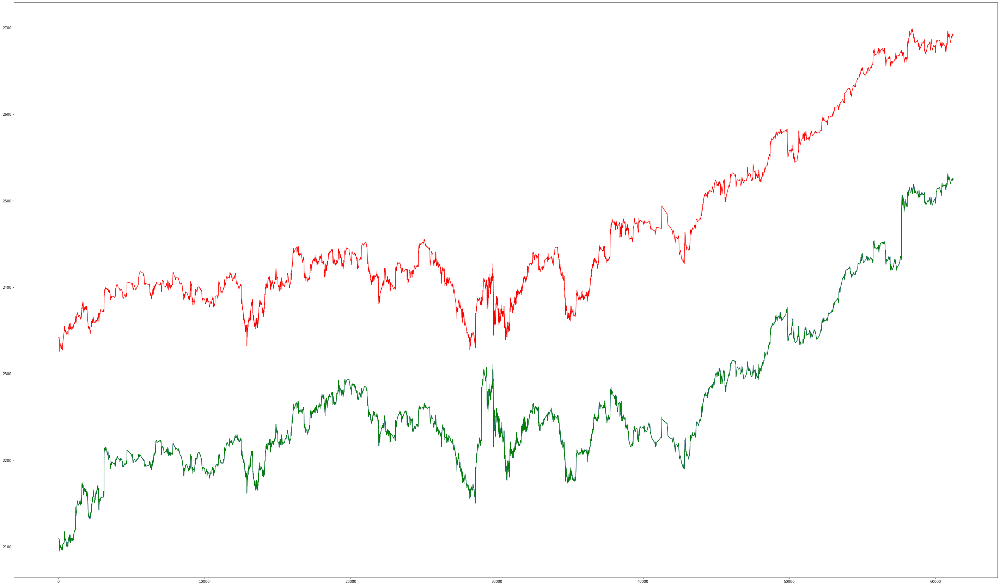

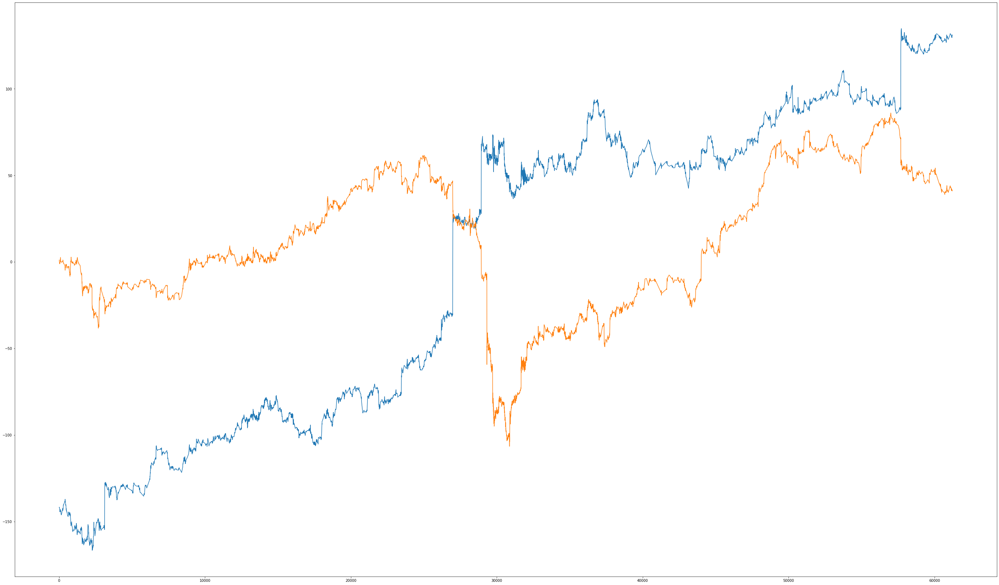

0.0013213186
7.235785e-07
0.08042421
iter 10	Distance-till-svd	0.08042421191930771	Total-variance-to-retain %	0.0005476185469888151	Total-variance-to-retain	7.235785233206116e-07
epoch = 1, train error = 0.00015200
epoch = 1001, train error = 0.00015353
epoch = 2001, train error = 0.00015120
epoch = 3001, train error = 0.00015284
epoch = 4001, train error = 0.00015140
epoch = 5001, train error = 0.00015257
epoch = 6001, train error = 0.00015281
epoch = 7001, train error = 0.00015298
epoch = 8001, train error = 0.00015326
epoch = 9001, train error = 0.00015371
epoch = 10001, train error = 0.00015311
epoch = 11001, train error = 0.00015287
epoch = 12001, train error = 0.00015276
epoch = 13001, train error = 0.00015266
epoch = 14001, train error = 0.00015159
epoch = 15001, train error = 0.00015403
[1.30500866e-03 1.90583580e-06 5.05456683e-07 2.32382206e-07
 1.52977776e-07 6.81095997e-08 5.42522187e-08 4.11213499e-08
 2.85867454e-08 2.20898801e-08 1.28467086e-08 1.01723341e-08
 8.94174246

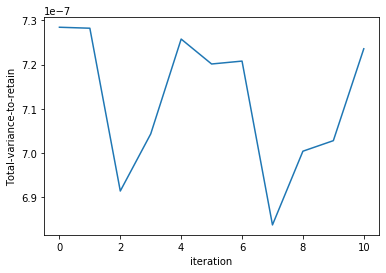

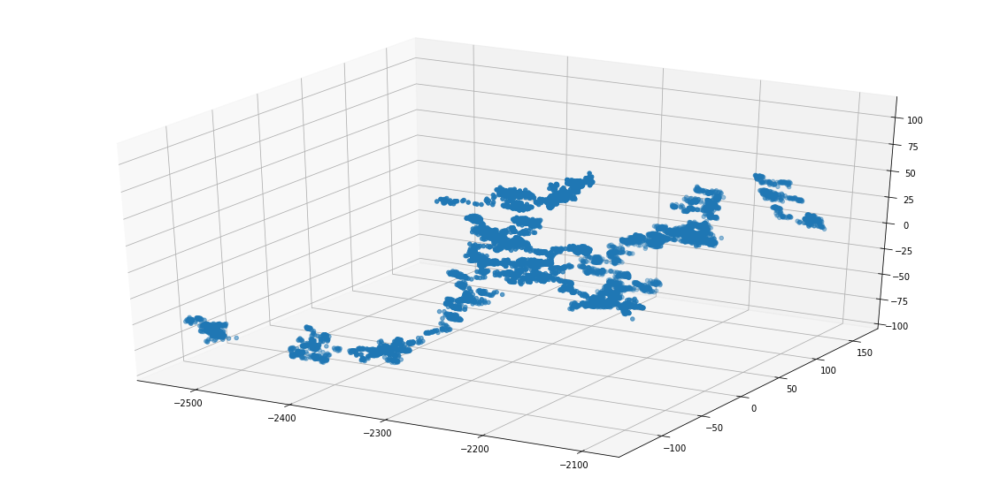

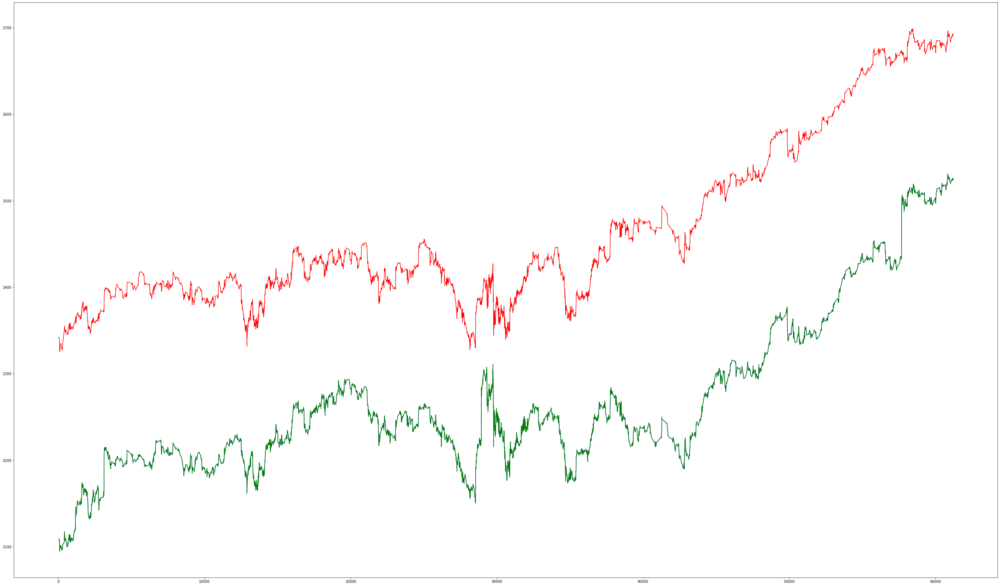

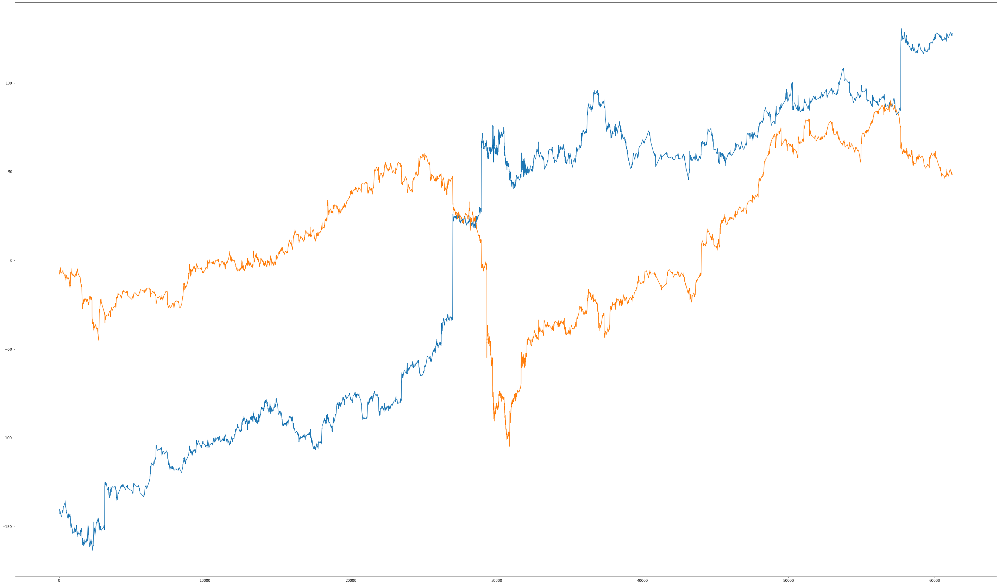

0.0013081109
6.9096177e-07
0.09455755
iter 11	Distance-till-svd	0.09455755352973938	Total-variance-to-retain %	0.000528213451616466	Total-variance-to-retain	6.909617695782799e-07
epoch = 1, train error = 0.00015319
epoch = 1001, train error = 0.00015436
epoch = 2001, train error = 0.00015241
epoch = 3001, train error = 0.00015286
epoch = 4001, train error = 0.00015451
epoch = 5001, train error = 0.00015435
epoch = 6001, train error = 0.00015304
epoch = 7001, train error = 0.00015247
epoch = 8001, train error = 0.00015337
epoch = 9001, train error = 0.00015424
epoch = 10001, train error = 0.00015268
epoch = 11001, train error = 0.00015188
epoch = 12001, train error = 0.00015368
epoch = 13001, train error = 0.00015409
epoch = 14001, train error = 0.00015314
epoch = 15001, train error = 0.00015316
[1.33585476e-03 2.01610897e-06 4.96244411e-07 2.50749991e-07
 1.79986756e-07 6.91193236e-08 5.11449585e-08 3.87404384e-08
 3.03298719e-08 1.96160581e-08 1.41887950e-08 9.73393721e-09
 9.21289711

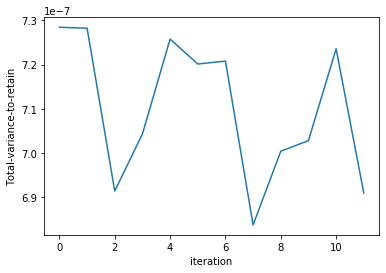

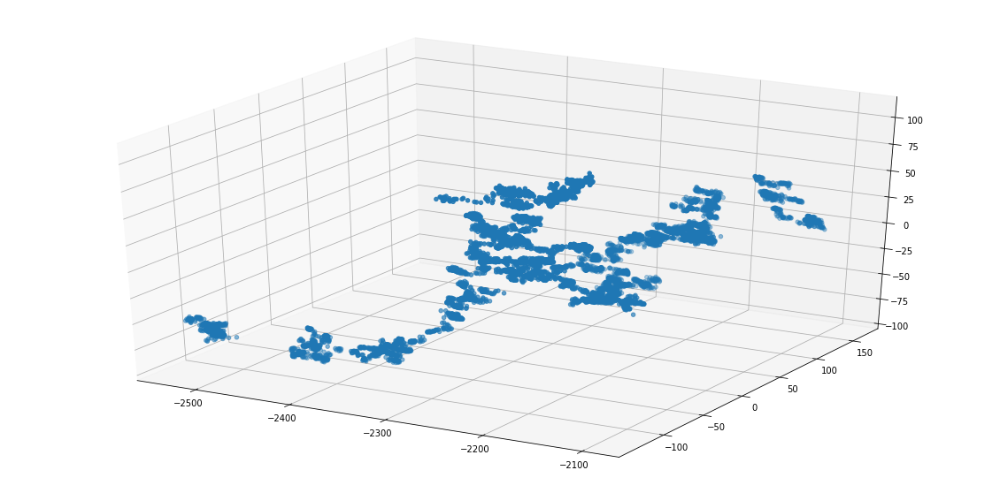

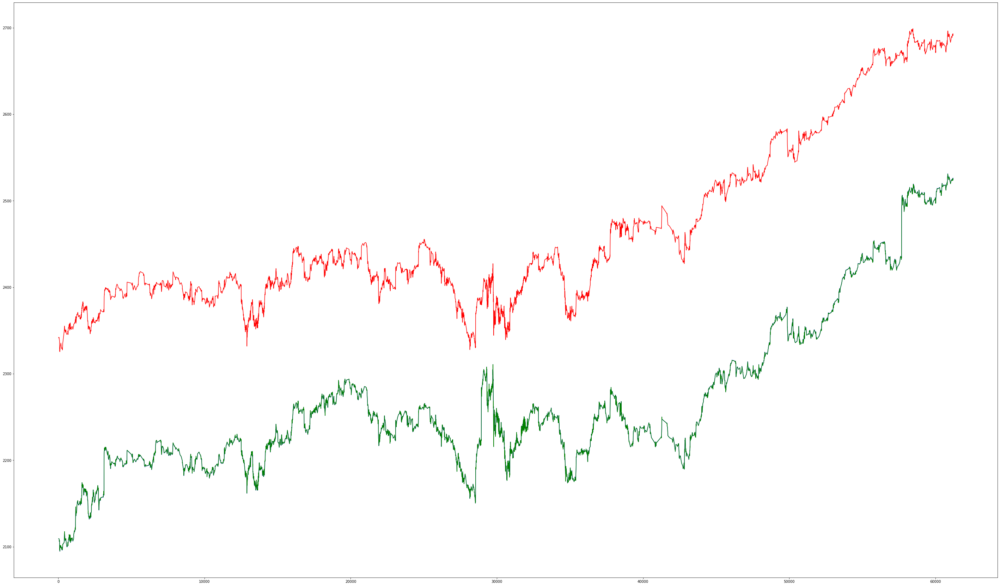

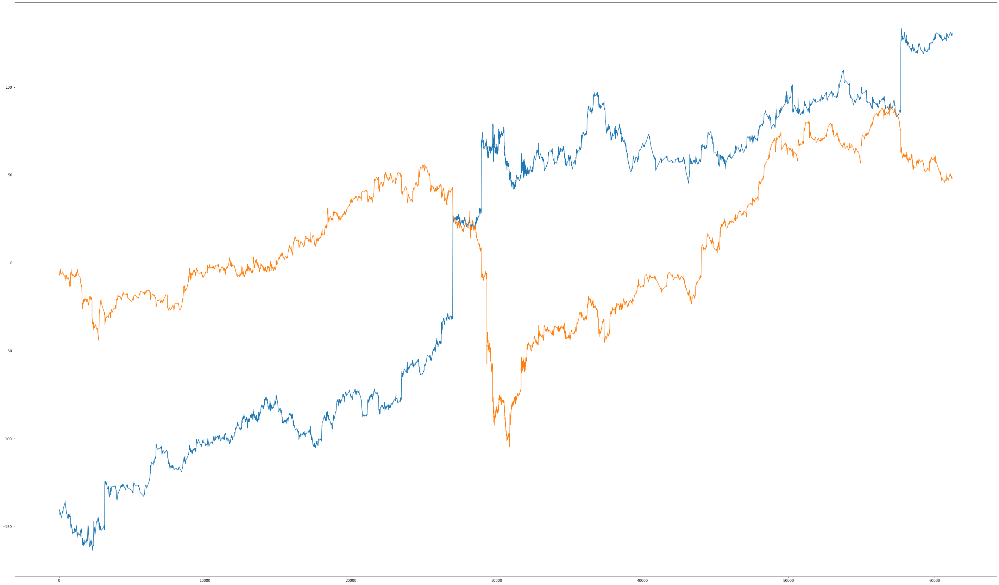

0.0013390988
7.3155735e-07
0.05166071
iter 12	Distance-till-svd	0.05166070908308029	Total-variance-to-retain %	0.0005463057314045727	Total-variance-to-retain	7.315573498090089e-07
epoch = 1, train error = 0.00015342
epoch = 1001, train error = 0.00015415
epoch = 2001, train error = 0.00015372
epoch = 3001, train error = 0.00015272
epoch = 4001, train error = 0.00015148
epoch = 5001, train error = 0.00015402
epoch = 6001, train error = 0.00015218
epoch = 7001, train error = 0.00015292
epoch = 8001, train error = 0.00015329
epoch = 9001, train error = 0.00015216
epoch = 10001, train error = 0.00015338
epoch = 11001, train error = 0.00015305
epoch = 12001, train error = 0.00015337
epoch = 13001, train error = 0.00015296
epoch = 14001, train error = 0.00015232
epoch = 15001, train error = 0.00015306
[1.32735446e-03 2.07692233e-06 4.86565568e-07 2.29432686e-07
 1.66608856e-07 6.47910454e-08 5.23857437e-08 3.99639966e-08
 3.02320835e-08 2.08376587e-08 1.41271350e-08 9.52182511e-09
 8.7651344

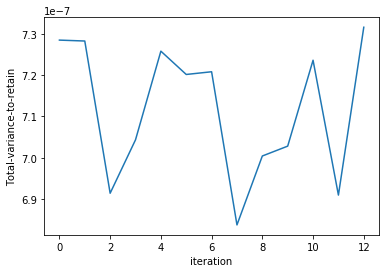

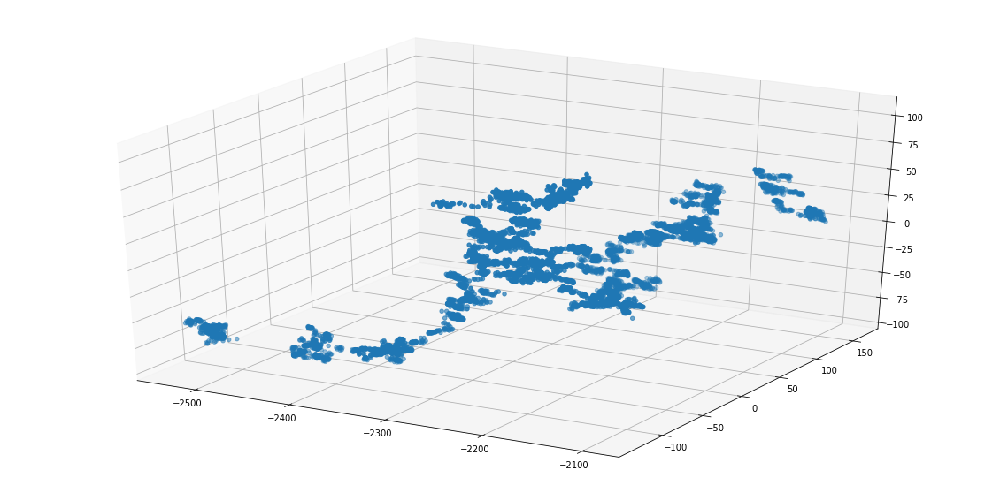

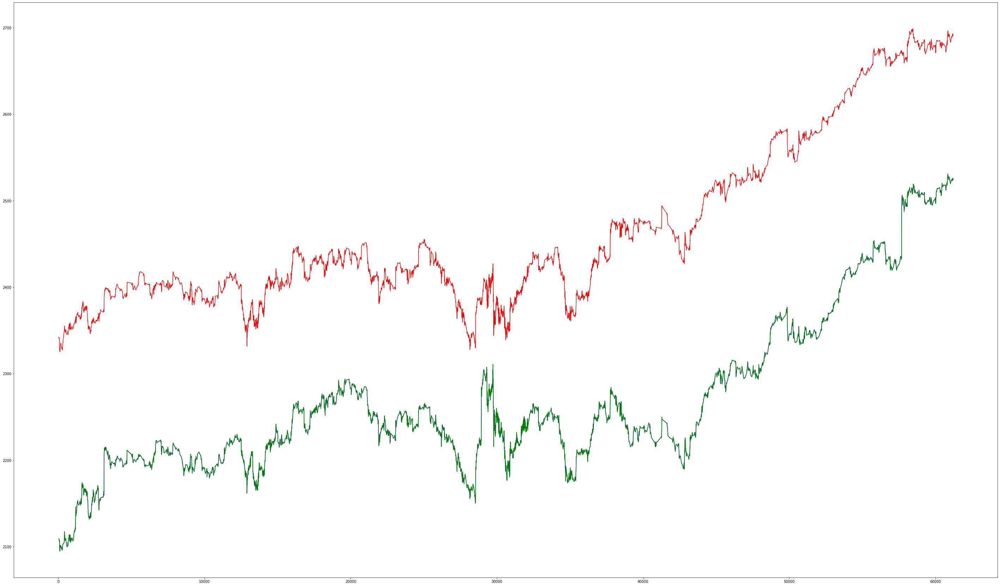

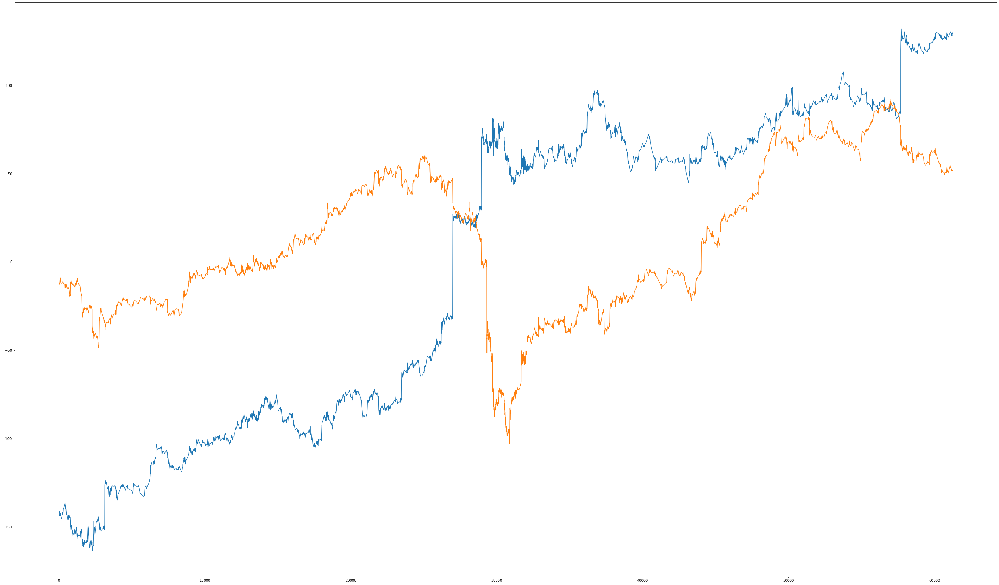

0.0013306144
6.9664213e-07
0.1161275
iter 13	Distance-till-svd	0.11612749844789505	Total-variance-to-retain %	0.000523549213539809	Total-variance-to-retain	6.966421324250405e-07
epoch = 1, train error = 0.00015446
epoch = 1001, train error = 0.00015437
epoch = 2001, train error = 0.00015423
epoch = 3001, train error = 0.00015312
epoch = 4001, train error = 0.00015301
epoch = 5001, train error = 0.00015355
epoch = 6001, train error = 0.00015371
epoch = 7001, train error = 0.00015422
epoch = 8001, train error = 0.00015318
epoch = 9001, train error = 0.00015304
epoch = 10001, train error = 0.00015373
epoch = 11001, train error = 0.00015306
epoch = 12001, train error = 0.00015254
epoch = 13001, train error = 0.00015246


KeyboardInterrupt: 

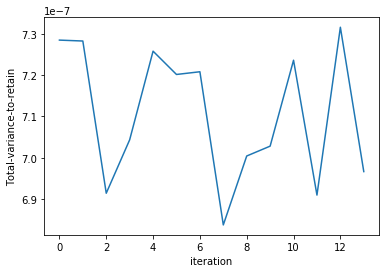

In [6]:
cur_w = np.random.normal(0, 0.35, (number_of_neurons,1))
cur_B =  np.random.normal(0, 0.35, (dimensionality, number_of_neurons))
cur_P = np.zeros((dimensionality, dimensionality))

lr = 0.0001
prev_run_res = 1000000000

# default session
sess = tf.Session()
init = tf.global_variables_initializer()
sess.run(init)

for s in range(0, Num_iter):

    lr = 0.001
    epoch = 0
    while lr > 0.0000001:  # iterations epoch < 500000 and 
        
        sess.run(target, feed_dict={new_lr: lr, Dataplace: Data, Lbd: Lambda,
            tf_data_w: cur_w,
            tf_data_B: cur_B,
            tf_data_P: cur_P
        })

        if epoch % 1000 == 0:
            run_res = 0.0
            for times in range(100):
                run_res = run_res + sess.run(loss, feed_dict={Dataplace: Data, Lbd: Lambda,
                                               tf_data_w: cur_w,
                                               tf_data_B: cur_B,
                                               tf_data_P: cur_P})
            run_res = run_res/100.0
            print("epoch = %d, train error = %.8f" % (epoch + 1, run_res))

            if  run_res > prev_run_res:
                lr *= lr_decay
            prev_run_res = run_res

        epoch += 1
        
    cur_w, cur_B = sess.run([w, B])    

    third_grad_psi = np.reshape(sess.run([grad_psi]), (BATCH_SIZE_2, dimensionality))
    for r in range(1000):
        sess.run([tf_data_second])
        np.concatenate((third_grad_psi, np.reshape(sess.run([grad_psi]), (BATCH_SIZE_2, dimensionality))), axis=0) 

    u, s, vh = np.linalg.svd(np.matmul(np.transpose(third_grad_psi), third_grad_psi), full_matrices=True)
    O = u[:,0:k:1]
    print(s)
#    print(u)
#    print(O)
    cur_P = np.matmul(O, np.transpose(O))
#    print(cur_P)

    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(111, projection='3d')
    Data2 = np.matmul(images, O)
    ax.scatter(Data2[:,0], Data2[:,1], Data2[:,2])
    plt.show()

    
    plt.figure(figsize=(50,30))
    plt.plot(indices, index[indices], 'r', label = "NASDAQ")


    firstPCA = np.matmul(nasdaq, np.reshape(D[0], (-1,1)))
    plt.plot(indices, -firstPCA[indices], 'b',  label = "First PCA Component")
    
    first = np.matmul(nasdaq, np.reshape(u[:,0], (-1,1)))
    Covariance = np.cov(index[indices], first[indices], bias=True)[0][1]
    bit = -1
    if Covariance>0:
        bit = 1
    plt.plot(indices, bit*first[indices], 'g',  label = "First MMD Component")
#    plt.title('NASDAQ & First MMD Component') 
    plt.show()
    
    plt.figure(figsize=(50,30))
    second = np.matmul(nasdaq, np.reshape(u[:,1], (-1,1)))
    Covariance = np.cov(index[indices], second[indices], bias=True)[0][1]
    bit = -1
    if Covariance>0:
        bit = 1
    plt.plot(indices, bit*second[indices], label = "Second MMD Component")

    third = np.matmul(nasdaq, np.reshape(u[:,2], (-1,1)))
    Covariance = np.cov(index[indices], third[indices], bias=True)[0][1]
    bit = -1
    if Covariance>0:
        bit = 1
    plt.plot(indices, bit*third[indices], label = "Third MMD Component")
#    plt.title('Second & Third MMD Component')
    plt.show()
    
    print(np.sum(np.square(third_grad_psi)))
    print(np.sum(np.square(third_grad_psi-np.matmul(third_grad_psi, cur_P))))
    print(np.sqrt(np.sum(np.square(P_svd-cur_P))))
    lib.plot.plot('Distance-till-svd', np.sqrt(np.sum(np.square(P_svd-cur_P))))
    lib.plot.plot('Total-variance-to-retain %', np.sum(np.square(third_grad_psi-np.matmul(third_grad_psi, cur_P)))/np.sum(np.square(third_grad_psi)))
    lib.plot.plot('Total-variance-to-retain', np.sum(np.square(third_grad_psi-np.matmul(third_grad_psi, cur_P))))
    lib.plot.flush()
    lib.plot.tick()

sess.close()
print(cur_P)

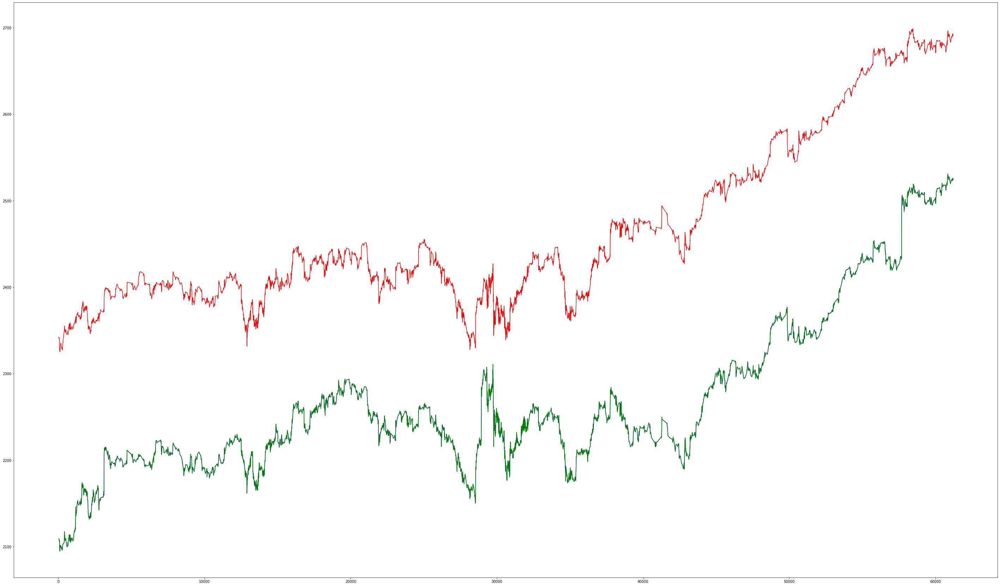

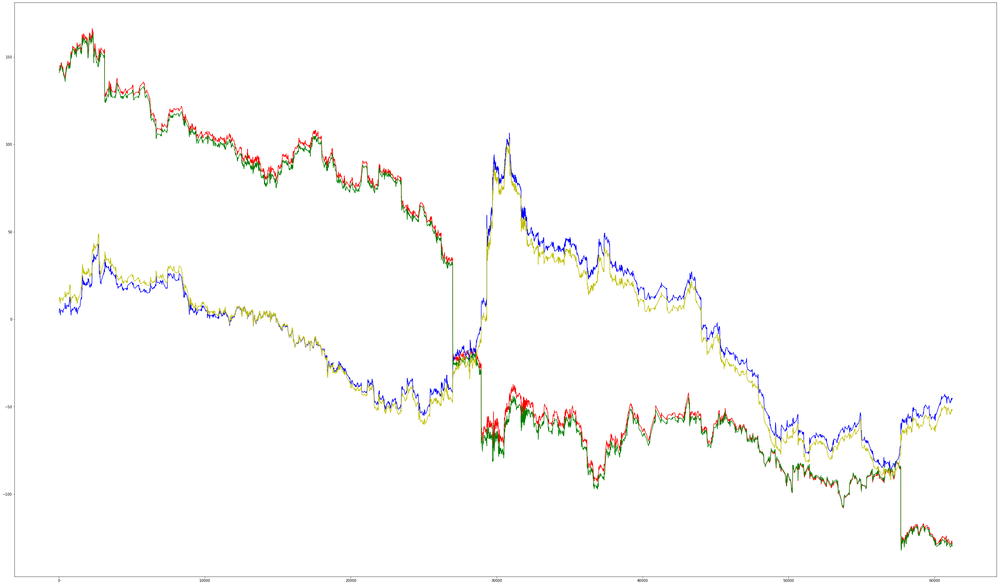

In [10]:
    plt.figure(figsize=(50,30))
    plt.plot(indices, index[indices], 'r', label = "NASDAQ")


    firstPCA = np.matmul(nasdaq, np.reshape(D[0], (-1,1)))
    plt.plot(indices, -firstPCA[indices], 'b',  label = "First PCA Component")
    
    first = np.matmul(nasdaq, np.reshape(u[:,0], (-1,1)))
    Covariance = np.cov(index[indices], first[indices], bias=True)[0][1]
    bit = -1
    if Covariance>0:
        bit = 1
    plt.plot(indices, bit*first[indices], 'g',  label = "First MMD Component")
#    plt.title('NASDAQ & First MMD Component') 
    plt.show()
    
    plt.figure(figsize=(50,30))

    secondPCA = np.matmul(nasdaq, np.reshape(D[1], (-1,1)))
    plt.plot(indices, secondPCA[indices], 'r',  label = "Second PCA Component")

    thirdPCA = np.matmul(nasdaq, np.reshape(D[2], (-1,1)))
    plt.plot(indices, -thirdPCA[indices], 'b',  label = "Third PCA Component")

    
    second = np.matmul(nasdaq, np.reshape(u[:,1], (-1,1)))
    Covariance = np.cov(index[indices], second[indices], bias=True)[0][1]
    plt.plot(indices, second[indices], 'g', label = "Second MMD Component")

    third = np.matmul(nasdaq, np.reshape(u[:,2], (-1,1)))
    plt.plot(indices, third[indices], 'y', label = "Third MMD Component")
    plt.show()